In [35]:
import pandas as pd
import scanpy as sc
import anndata as ad
import numpy as np
import scanorama
#import scvi
from pySankey import sankey
#from scvi.model.utils import mde
#import scmap
import matplotlib as mpl
import matplotlib.pyplot as plt

In [36]:
sc.settings.set_figure_params(dpi=200)

In [6]:
%%bash
pwd

/Users/mubashermohammed/Desktop/desktop_mubasher/seurat_analysis


In [213]:
#bulk_data = pd.read_csv('/Users/mubashermohammed/Desktop/Gomesetal/Bulk_Biljion/gametocyte_transcriptome_data.csv'
 #                    ,index_col=0  )


In [33]:
bulk_data = pd.read_excel('/Users/mubashermohammed/Desktop/Gomesetal/Bulk_Biljion/gametocyte_cmp_data.xlsx',
                          engine='openpyxl',index_col=0)

# Print the expression DataFrame
bulk_data

,T.Day-2,R.Day-1,T.Day0,R.Day1,T.Day2,I.Day3,I/II.Day4,II.Day5,II/III.Day6,III/IV.Day7,IV.Day8,IV.Day9,IV/V.Day10,V.Day11,V.Day12,V.Day13
GeneID,,,,,,,,,,,,,,,,
PF3D7_0100900,-3.21,1.87,-0.84,1.57,-1.59,-2.25,-1.54,-1.85,-0.29,-2.32,-0.07,-0.58,-0.84,-1.26,0.29,0.24
PF3D7_0101500,-1.38,-0.43,-1.11,-0.63,-1.67,-1.46,-1.16,-1.28,-0.86,-1.42,-1.49,-1.30,-1.39,-1.46,-1.05,-1.52
PF3D7_0102200,-2.82,1.07,-0.75,1.07,-1.14,-1.34,-3.00,-2.05,-1.35,-1.91,0.07,-0.37,-1.18,-0.73,0.88,0.27
PF3D7_0108500,-2.71,1.91,-0.88,1.01,-1.47,-1.16,-2.01,-2.05,-1.01,-1.81,-0.59,-0.60,-0.60,-0.95,1.41,-0.21
PF3D7_0113300,-1.82,1.23,-1.50,1.45,-1.79,-1.01,-2.04,-1.76,-2.00,-1.98,-1.66,-1.62,-2.49,-2.11,-1.64,-1.94
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
PFC10_API0049:tRNA,1.32,NaN,0.67,0.82,1.15,0.61,-0.62,0.27,0.39,0.15,0.23,-0.19,-1.11,0.36,-0.81,-0.19
PFC10_API0050:tRNA,1.69,NaN,0.79,0.58,1.67,0.83,-1.08,0.48,-0.17,0.40,-0.48,-1.15,-1.96,0.03,-1.55,-0.17
PFC10_API0053:tRNA,1.37,NaN,0.30,-0.71,1.64,0.58,NaN,-0.72,-0.71,0.30,-1.01,-1.64,-1.63,-0.28,-1.83,-0.53


In [34]:
raw_data = np.power(2, bulk_data)

# Print the raw data
raw_data

,T.Day-2,R.Day-1,T.Day0,R.Day1,T.Day2,I.Day3,I/II.Day4,II.Day5,II/III.Day6,III/IV.Day7,IV.Day8,IV.Day9,IV/V.Day10,V.Day11,V.Day12,V.Day13
GeneID,,,,,,,,,,,,,,,,
PF3D7_0100900,0.108067,3.655326,0.558644,2.969047,0.332171,0.210224,0.343885,0.277392,0.817902,0.200267,0.952638,0.668964,0.558644,0.417544,1.222640,1.180993
PF3D7_0101500,0.384219,0.742262,0.463294,0.646176,0.314253,0.363493,0.447513,0.411796,0.550953,0.373712,0.356013,0.406126,0.381565,0.363493,0.482968,0.348686
PF3D7_0102200,0.141610,2.099433,0.594604,2.099433,0.453760,0.395021,0.125000,0.241484,0.392292,0.266093,1.049717,0.773782,0.441351,0.602904,1.840375,1.205808
PF3D7_0108500,0.152830,3.758091,0.543367,2.013911,0.360982,0.447513,0.248273,0.241484,0.496546,0.285191,0.664343,0.659754,0.659754,0.517632,2.657372,0.864537
PF3D7_0113300,0.283221,2.345670,0.353553,2.732081,0.289172,0.496546,0.243164,0.295248,0.250000,0.253490,0.316439,0.325335,0.178006,0.231647,0.320856,0.260616
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
PFC10_API0049:tRNA,2.496661,NaN,1.591073,1.765406,2.219139,1.526259,0.650671,1.205808,1.310393,1.109569,1.172835,0.876606,0.463294,1.283426,0.570382,0.876606
PFC10_API0050:tRNA,3.226567,NaN,1.729074,1.494849,3.182146,1.777685,0.473029,1.394744,0.888843,1.319508,0.716978,0.450625,0.257028,1.021012,0.341510,0.888843
PFC10_API0053:tRNA,2.584706,NaN,1.231144,0.611320,3.116658,1.494849,NaN,0.607097,0.611320,1.231144,0.496546,0.320856,0.323088,0.823591,0.281265,0.692555


In [35]:
imputed_data = raw_data.fillna(raw_data.mean())
imputed_data

,T.Day-2,R.Day-1,T.Day0,R.Day1,T.Day2,I.Day3,I/II.Day4,II.Day5,II/III.Day6,III/IV.Day7,IV.Day8,IV.Day9,IV/V.Day10,V.Day11,V.Day12,V.Day13
GeneID,,,,,,,,,,,,,,,,
PF3D7_0100900,0.108067,3.655326,0.558644,2.969047,0.332171,0.210224,0.343885,0.277392,0.817902,0.200267,0.952638,0.668964,0.558644,0.417544,1.222640,1.180993
PF3D7_0101500,0.384219,0.742262,0.463294,0.646176,0.314253,0.363493,0.447513,0.411796,0.550953,0.373712,0.356013,0.406126,0.381565,0.363493,0.482968,0.348686
PF3D7_0102200,0.141610,2.099433,0.594604,2.099433,0.453760,0.395021,0.125000,0.241484,0.392292,0.266093,1.049717,0.773782,0.441351,0.602904,1.840375,1.205808
PF3D7_0108500,0.152830,3.758091,0.543367,2.013911,0.360982,0.447513,0.248273,0.241484,0.496546,0.285191,0.664343,0.659754,0.659754,0.517632,2.657372,0.864537
PF3D7_0113300,0.283221,2.345670,0.353553,2.732081,0.289172,0.496546,0.243164,0.295248,0.250000,0.253490,0.316439,0.325335,0.178006,0.231647,0.320856,0.260616
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
PFC10_API0049:tRNA,2.496661,1.137672,1.591073,1.765406,2.219139,1.526259,0.650671,1.205808,1.310393,1.109569,1.172835,0.876606,0.463294,1.283426,0.570382,0.876606
PFC10_API0050:tRNA,3.226567,1.137672,1.729074,1.494849,3.182146,1.777685,0.473029,1.394744,0.888843,1.319508,0.716978,0.450625,0.257028,1.021012,0.341510,0.888843
PFC10_API0053:tRNA,2.584706,1.137672,1.231144,0.611320,3.116658,1.494849,1.196541,0.607097,0.611320,1.231144,0.496546,0.320856,0.323088,0.823591,0.281265,0.692555


In [309]:
#normalized_data = np.log1p(bulk_data)
#normalized_data

In [352]:
adata_bulk = ad.AnnData(imputed_data.T)

/var/folders/h5/cwp4w7cd35554f006psf_z9w0000gn/T/ipykernel_54691/2996770539.py:1: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  adata_bulk = ad.AnnData(imputed_data.T)


In [353]:
adata_bulk

AnnData object with n_obs × n_vars = 16 × 5436

In [354]:
batch_name = "Biljon et al Bulk_data"

# Add the batch information as a new column in the observations metadata
adata_bulk.obs['Batch'] = batch_name

# Print the updated AnnData object
print(adata_bulk)

AnnData object with n_obs × n_vars = 16 × 5436
    obs: 'Batch'


In [223]:
#adata_bulk.write_h5ad('/Users/mubashermohammed/Desktop/Gomesetal/Bulk_Biljion/adata_bulk.h5ad')

#adata_bulk = sc.read_h5ad('/Users/mubashermohammed/Desktop/Gomesetal/Bulk_Biljion/adata_bulk.h5ad')

In [588]:
#batch_name = "Time_course"

# Add the batch information as a new column in the observations metadata
adata_bulk.obs['Time_course'] = adata_bulk.obs_names

# Print the updated AnnData object

adata_bulk.obs

,Batch,Time_course
T.Day-2,Biljon et al Bulk_data,T.Day-2
R.Day-1,Biljon et al Bulk_data,R.Day-1
T.Day0,Biljon et al Bulk_data,T.Day0
R.Day1,Biljon et al Bulk_data,R.Day1
T.Day2,Biljon et al Bulk_data,T.Day2
I.Day3,Biljon et al Bulk_data,I.Day3
I/II.Day4,Biljon et al Bulk_data,I/II.Day4
II.Day5,Biljon et al Bulk_data,II.Day5
II/III.Day6,Biljon et al Bulk_data,II/III.Day6
III/IV.Day7,Biljon et al Bulk_data,III/IV.Day7


In [356]:
adata_bulk.raw = adata_bulk
sc.pp.normalize_total(adata_bulk, target_sum=1e4)
sc.pp.log1p(adata_bulk)

In [357]:
sc.pp.highly_variable_genes(
    adata_bulk, n_top_genes=4000,
    inplace=True, batch_key="Batch")
print("Highly variable genes: %d"%sum(adata_bulk.var.highly_variable))

Highly variable genes: 4000


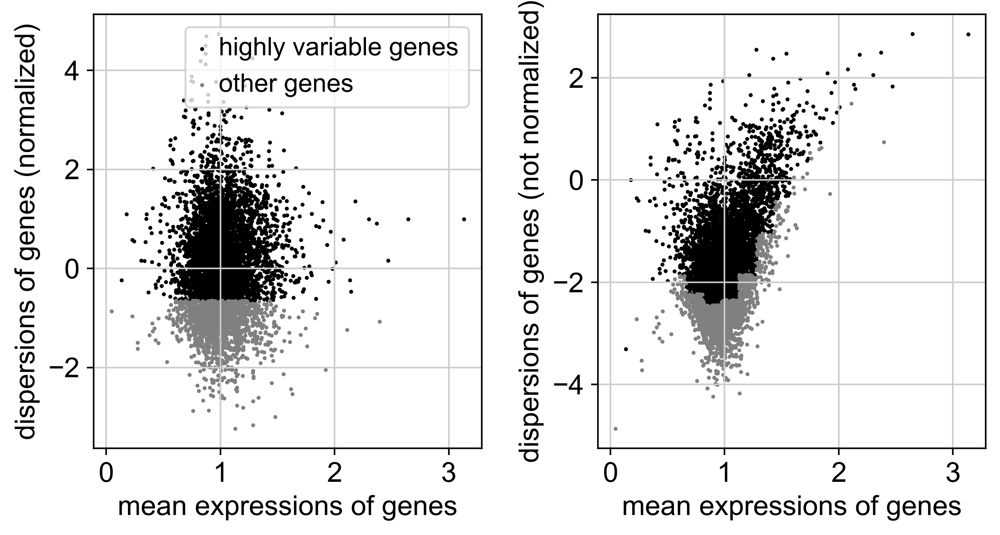

In [8]:
sc.pl.highly_variable_genes(adata_bulk)

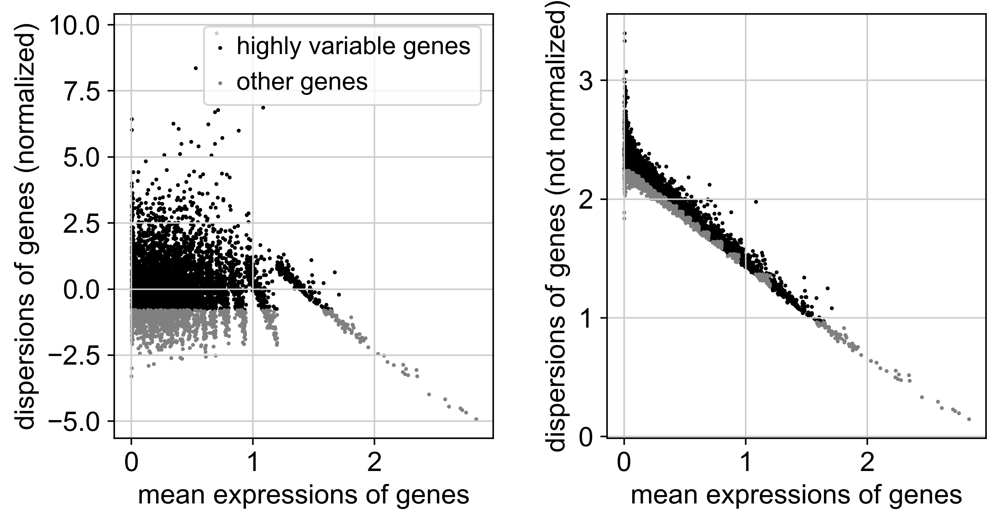

In [479]:
sc.pl.highly_variable_genes(adata)

In [257]:
#from sklearn.impute import SimpleImputer
#imputer = SimpleImputer(strategy='mean')  # or 'median', 'most_frequent', etc.
#imputed_data = imputer.fit_transform(adata_bulk.X)
#adata_bulk.X = imputed_data

In [359]:
#sc.pp.scale(adata_bulk, max_value=10)
sc.tl.pca(
    data = adata_bulk, 
    svd_solver = 'arpack',
    n_comps = 10,
    use_highly_variable = True)

/Users/mubashermohammed/miniconda3/envs/cellrank/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


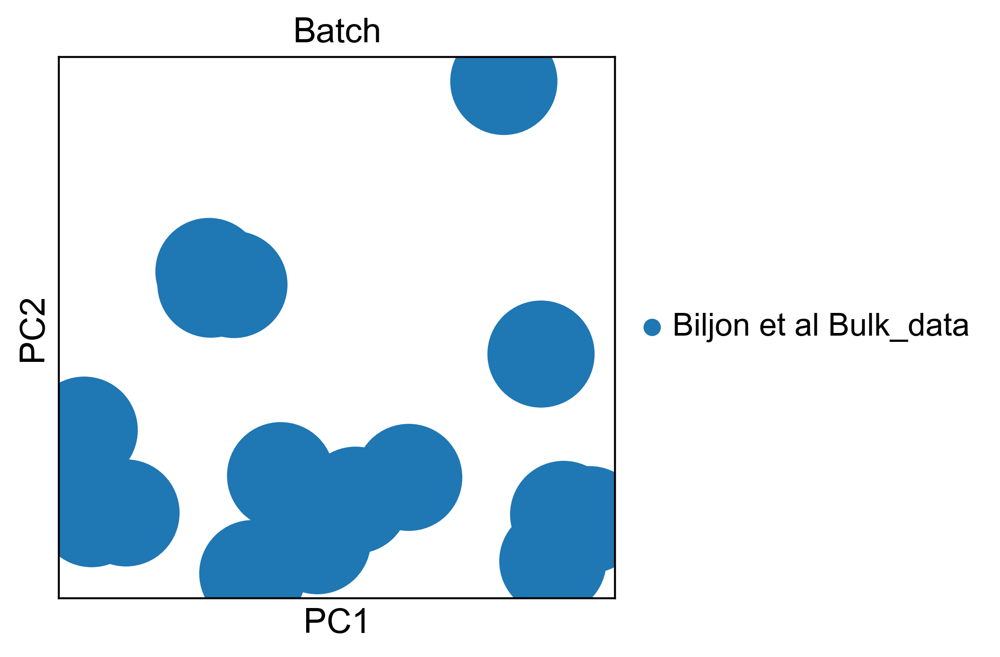

In [374]:
sc.pl.pca(adata_bulk, color='Batch')

In [395]:
imputed_data

,T.Day-2,R.Day-1,T.Day0,R.Day1,T.Day2,I.Day3,I/II.Day4,II.Day5,II/III.Day6,III/IV.Day7,IV.Day8,IV.Day9,IV/V.Day10,V.Day11,V.Day12,V.Day13
GeneID,,,,,,,,,,,,,,,,
PF3D7_0100900,0.108067,3.655326,0.558644,2.969047,0.332171,0.210224,0.343885,0.277392,0.817902,0.200267,0.952638,0.668964,0.558644,0.417544,1.222640,1.180993
PF3D7_0101500,0.384219,0.742262,0.463294,0.646176,0.314253,0.363493,0.447513,0.411796,0.550953,0.373712,0.356013,0.406126,0.381565,0.363493,0.482968,0.348686
PF3D7_0102200,0.141610,2.099433,0.594604,2.099433,0.453760,0.395021,0.125000,0.241484,0.392292,0.266093,1.049717,0.773782,0.441351,0.602904,1.840375,1.205808
PF3D7_0108500,0.152830,3.758091,0.543367,2.013911,0.360982,0.447513,0.248273,0.241484,0.496546,0.285191,0.664343,0.659754,0.659754,0.517632,2.657372,0.864537
PF3D7_0113300,0.283221,2.345670,0.353553,2.732081,0.289172,0.496546,0.243164,0.295248,0.250000,0.253490,0.316439,0.325335,0.178006,0.231647,0.320856,0.260616
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
PFC10_API0049:tRNA,2.496661,1.137672,1.591073,1.765406,2.219139,1.526259,0.650671,1.205808,1.310393,1.109569,1.172835,0.876606,0.463294,1.283426,0.570382,0.876606
PFC10_API0050:tRNA,3.226567,1.137672,1.729074,1.494849,3.182146,1.777685,0.473029,1.394744,0.888843,1.319508,0.716978,0.450625,0.257028,1.021012,0.341510,0.888843
PFC10_API0053:tRNA,2.584706,1.137672,1.231144,0.611320,3.116658,1.494849,1.196541,0.607097,0.611320,1.231144,0.496546,0.320856,0.323088,0.823591,0.281265,0.692555


In [222]:
#bulk_data = pd.DataFrame(imputed_data)
adata = sc.read('/Users/mubashermohammed/Desktop/Gomesetal/mohammedetal.h5ad', cache=True)

In [31]:
adata.var_names_make_unique()

In [36]:
log1p_data = adata.X

# Revert the log1p transformed data to the original scale
original_data = np.expm1(log1p_data)

# Update the `.X` attribute in `adata` with the original data
adata.X = original_data

In [11]:
concatenated_adata = adata.concatenate(adata_bulk)

/Users/mubashermohammed/miniconda3/envs/cellrank/lib/python3.8/site-packages/anndata/_core/anndata.py:1755: FutureWarning: The AnnData.concatenate method is deprecated in favour of the anndata.concat function. Please use anndata.concat instead.

See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  warnings.warn(
/Users/mubashermohammed/miniconda3/envs/cellrank/lib/python3.8/site-packages/anndata/_core/merge.py:1111: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(


In [12]:
concatenated_adata.layers['counts'] = concatenated_adata.X.copy()

In [13]:
sc.pp.normalize_total(concatenated_adata, target_sum=1e4)
sc.pp.log1p(concatenated_adata)

concatenated_adata.raw = concatenated_adata
sc.pp.highly_variable_genes(concatenated_adata, flavor = 'seurat_v3', n_top_genes=2000, layer = 'counts', 
                           batch_key= 'Batch', subset =True)

/Users/mubashermohammed/miniconda3/envs/cellrank/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:352: RuntimeWarning: invalid value encountered in log1p
  np.log1p(X, out=X)
/Users/mubashermohammed/miniconda3/envs/cellrank/lib/python3.8/site-packages/scanpy/preprocessing/_highly_variable_genes.py:62: UserWarning: `flavor='seurat_v3'` expects raw count data, but non-integers were found.
  warnings.warn(


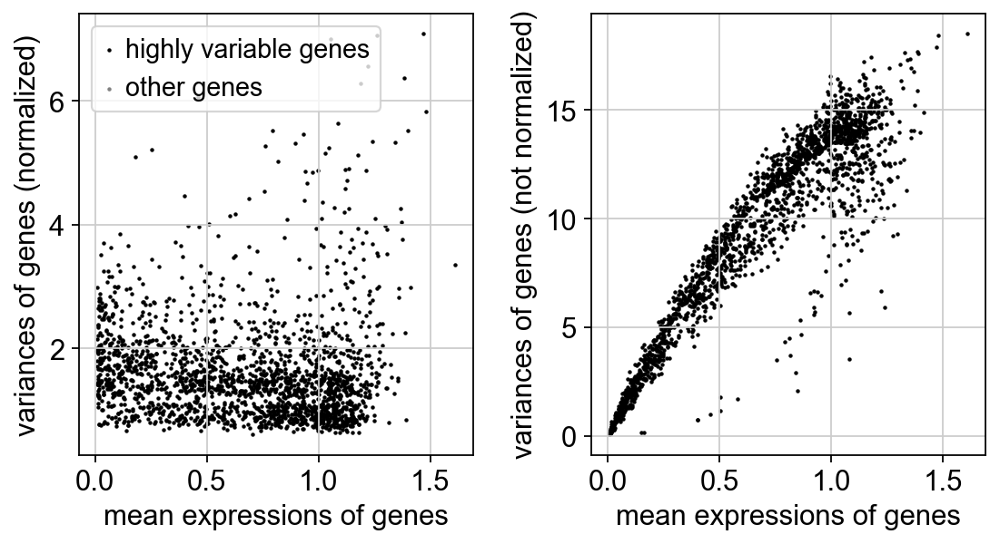

In [76]:
sc.pl.highly_variable_genes(concatenated_adata)

In [98]:
concatenated_adata =sc.read_h5ad('/Users/mubashermohammed/Desktop/Gomesetal/bulk_SC_concatenated.h5ad')

In [99]:
sc.pp.scale(concatenated_adata, max_value=10)

In [100]:
concatenated_adata.X = np.nan_to_num(concatenated_adata.X)

# Optionally, you can remove cells (observations) that contain NaN values
sc.pp.filter_cells(concatenated_adata, min_counts=1)

# Verify that NaN values have been removed
print(np.isnan(concatenated_adata.X).sum())

0


In [193]:

print(adata, adata_bulk)

AnnData object with n_obs × n_vars = 4555 × 5019
    obs: 'n_genes', 'umi_counts', 'louvain_1.0', 'louvain_0.6', 'louvain_0.4', 'louvain_1.4', 'clusters', 'S_score', 'G2M_score', 'phase', 'male_signature', 'female_signature', 'cell_class', 'annotation', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'imcs_score', 'Regulon.PF3D7_0420300....', 'Regulon.PF3D7_1107800....', 'Regulon.PF3D7_1139300....', 'Regulon.PF3D7_1139300.....1', 'Regulon.PF3D7_1222400....', 'Regulon.PF3D7_1239200....', 'Regulon.PF3D7_1350900....', 'Regulon.PF3D7_1408200....', 'pruned_labels', 'bulk_labels', 'first_labels', 'frist_labels', 'Batch'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'ribo', 'hb', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'Regulon(PF3D7_0420300 (+))', 'Regulon(PF3D7_1107800 (+))'

In [136]:
from sklearn.neighbors import KNeighborsClassifier

In [1311]:

adata = sc.read('/Users/mubashermohammed/Desktop/Gomesetal/mohammedetal.h5ad', cache=True)
ad_bulk = sc.read_h5ad('/Users/mubashermohammed/Desktop/Gomesetal/Bulk_Biljion/adata_bulk.h5ad')

In [4]:
##subset adata_bulk

subset_values = ['I.Day3', 'I/II.Day4', 'II.Day5', 'II/III.Day6', 'III/IV.Day7', 'IV.Day8', 'IV/V.Day10']

# Step 2: Create the subset condition
subset_condition = ad_bulk.obs['Time_course'].isin(subset_values)

# Step 3: Subset the AnnData object
adata_bulk = ad_bulk[subset_condition]

# Step 4: View the subsetted AnnData object
print(adata_bulk)


View of AnnData object with n_obs × n_vars = 7 × 5436
    obs: 'Batch', 'Time_course'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'Batch_colors', 'hvg', 'log1p', 'pca'
    obsm: 'X_pca', 'X_scanorama'
    varm: 'PCs'


Highly variable genes: 5000
Highly variable genes: 5000


/Users/mubashermohammed/miniconda3/envs/cellrank/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:524: ImplicitModificationWarning:

Trying to modify attribute `.obs` of view, initializing view as actual.



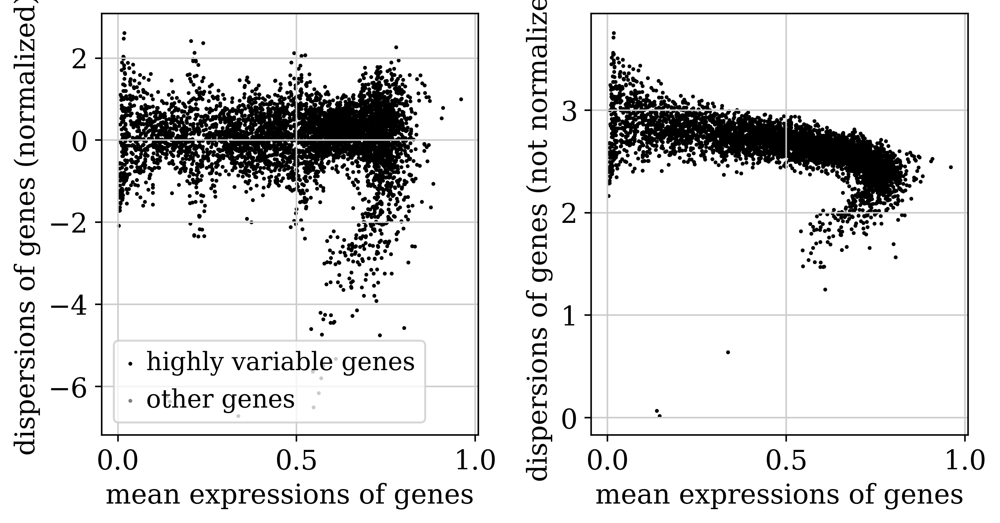

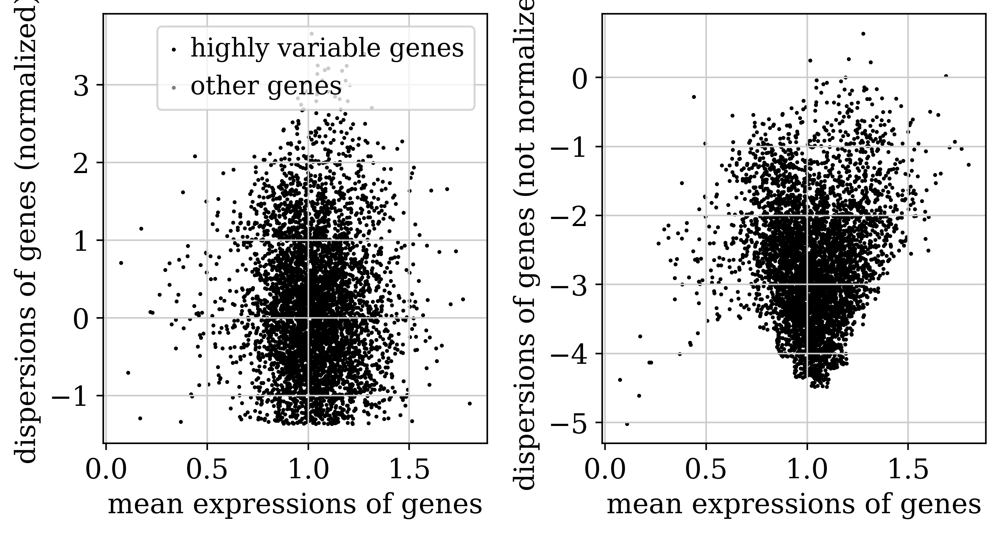

In [834]:
#sc.pp.normalize_per_cell(adata, counts_per_cell_after=1e4)
#sc.pp.log1p(adata)

sc.pp.highly_variable_genes(
    adata, n_top_genes=5000,
    inplace=True, ) #batch_key="cell_class"
print("Highly variable genes: %d"%sum(adata.var.highly_variable))


sc.pp.normalize_per_cell(adata_bulk, counts_per_cell_after=1e4)
sc.pp.log1p(adata_bulk)

sc.pp.highly_variable_genes(
    adata_bulk, n_top_genes=5000,
    inplace=True, ) #batch_key="Batch"
print("Highly variable genes: %d"%sum(adata_bulk.var.highly_variable))

adata = adata[:, adata.var['highly_variable']]
adata_bulk = adata_bulk[:, adata_bulk.var['highly_variable']]

sc.pl.highly_variable_genes(adata)
sc.pl.highly_variable_genes(adata_bulk)

In [644]:
#sc.pp.normalize_per_cell(adata, counts_per_cell_after=1e4)
#sc.pp.log1p(adata)
#sc.pp.scale(adata)

# Step 2: Preprocess the single-cell data
#sc.pp.normalize_per_cell(adata_bulk, counts_per_cell_after=1e4)
#sc.pp.log1p(adata_bulk)
#sc.pp.scale(adata_bulk)

ref_expression = adata_bulk.X
sc_expression = adata.X

# Check if both reference and single-cell data contain at least one sample
if ref_expression.shape[0] == 0 or sc_expression.shape[0] == 0:
    raise ValueError("Both reference and single-cell data must contain at least one sample")

# Step 4: Train a KNN classifier on the reference data
labels = adata_bulk.obs['Time_course']  # Assuming you have cell labels in the reference data
knn = KNeighborsClassifier(n_neighbors=2)  # You can adjust the number of neighbors

# Check if the reference data contains at least one unique label
if len(labels.unique()) < 2:
    raise ValueError("Reference data must contain at least two unique labels for classification")

knn.fit(ref_expression, labels)

# Step 5: Predict labels for the single-cell data
predicted_labels = knn.predict(sc_expression)

# Step 6: Add the predicted labels as a new column in the single-cell data
adata.obs['predicted_labels_MM'] = predicted_labels

/var/folders/h5/cwp4w7cd35554f006psf_z9w0000gn/T/ipykernel_67845/3445209254.py:31: ImplicitModificationWarning:

Trying to modify attribute `.obs` of view, initializing view as actual.



/Users/mubashermohammed/miniconda3/envs/cellrank/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored

/Users/mubashermohammed/miniconda3/envs/cellrank/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



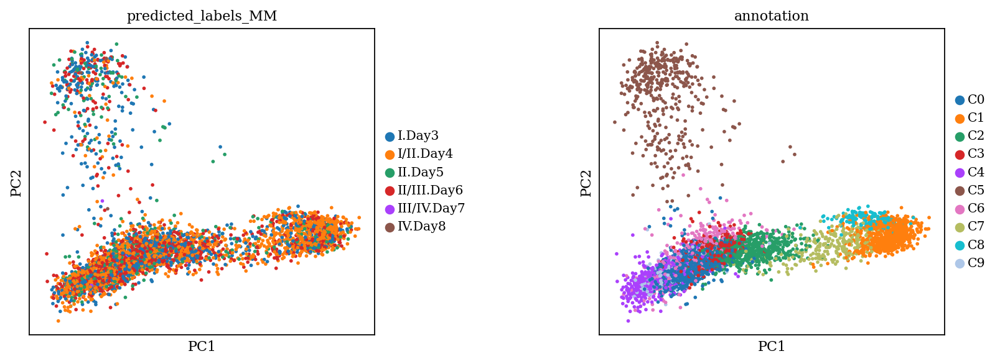

In [645]:
sc.pl.pca(adata, color=['predicted_labels_MM', 'annotation'], wspace =0.5)

In [1391]:
colorDict =  {'C0':'#1f77b4','C1':'#ff7f0e','C2':'#279e68',
              'C3':'#d62728','C4':'#aa40fc', 'C5':'#8c564b','C6':'#e377c2', 'C7':'#b5bd61','C8':'#17becf',
             'C9':'#aec7e8','Early gametocyte':'darkblue',
             'Female lineage':'magenta', 'Male lineage':'greenyellow', 'I.Day3':'#1f77b4','I/II.Day4':'#ff7f0e','II.Day5':'#279e68',
              'II/III.Day6':'#d62728','III/IV.Day7':'#aa40fc', 'IV.Day8':'#8c564b' }

In [623]:
adata.uns['predicted_labels_MM_colors']

['#1f77b4', '#ff7f0e', '#279e68', '#d62728', '#aa40fc', '#8c564b']

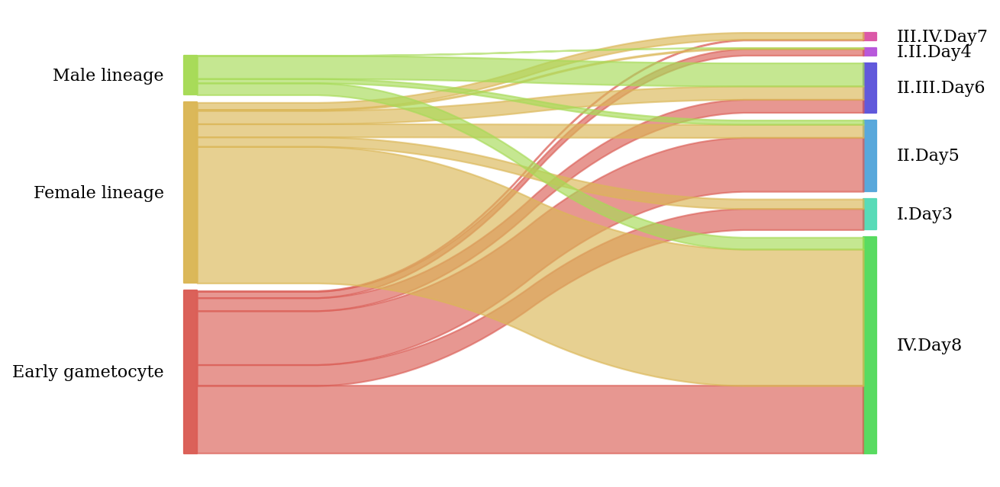

In [1393]:
sankey.sankey(adata.obs['cell_class'], adata.obs['stage'], aspect=15,
              fontsize=10, figure_name="cells_sankey",)
plt.gcf().set_size_inches(8,5)
plt.show()
#plt.savefig("./figures/sankey_cell_vs_clusters.pdf", facecolor='w', edgecolor='w',
 #      orientation='potrait', format="png",
  #    transparent=True, metadata=None, dpi =200)     colorDict=colorDict,



In [1384]:
colorDict =  {'C0':'#1f77b4','C1':'#ff7f0e','C2':'#279e68',
              'C3':'#d62728','C4':'#aa40fc', 'C5':'#8c564b','C6':'#e377c2', 'C7':'#b5bd61','C8':'#17becf',
             'C9':'#aec7e8','Early gametocyte':'darkblue',
             'Female lineage':'magenta', 'Male lineage':'greenyellow'}

In [1378]:
adata.obs['stage']

GTTGCTCTCGATAACC-1    IV.Day8
ATCCTATAGACTCTTG-1     I.Day3
CCCAACTAGATACATG-1    IV.Day8
TCTTTGAAGACCTTTG-1    II.Day5
TCTTTGAGTGAGGATC-1     I.Day3
                       ...   
TTAGGCAGTATCCTTT-1    IV.Day8
AGGCATTGTATCGCTA-1    IV.Day8
AACCACATCTAGGCCG-1    IV.Day8
AAAGTCCGTAATGATG-1    IV.Day8
CTTCAATAGCTAATGA-1    IV.Day8
Name: stage, Length: 4555, dtype: category
Categories (6, object): ['I.Day3', 'I.II.Day4', 'II.Day5', 'II.III.Day6', 'III.IV.Day7', 'IV.Day8']

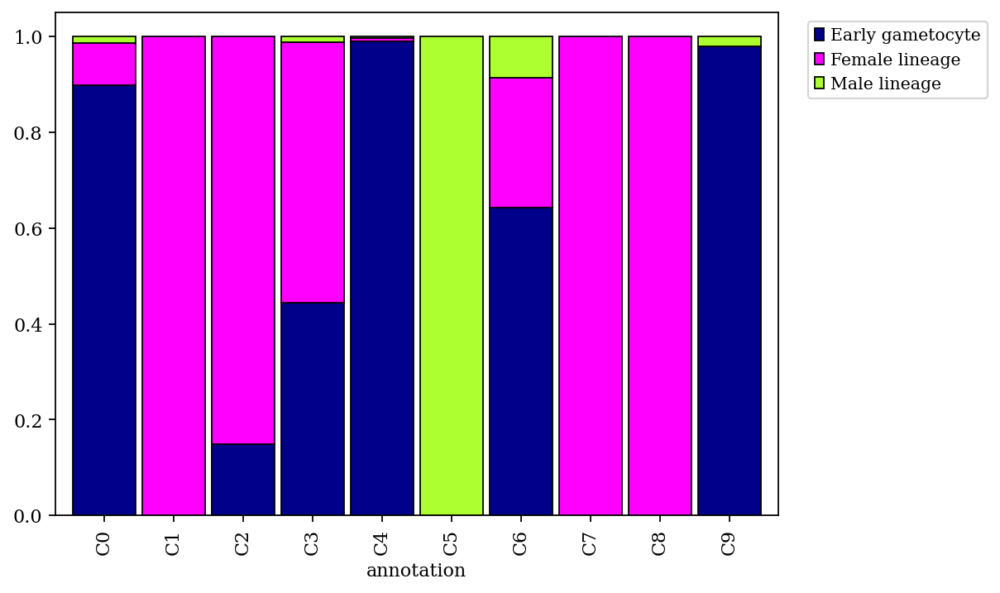

In [1394]:
tmp = pd.crosstab(subset_adata.obs['annotation'],subset_adata.obs['cell_class'], normalize='index')
ax = tmp.plot.bar(stacked=True, edgecolor='black', lw=0.8, figsize=(7,5), width=0.9,color = colorDict)



horiz_offset = 1.03
vert_offset = 1.
ax.grid(False)
ax.legend(bbox_to_anchor=(horiz_offset, vert_offset))
labels = ['I.Day3', 'I.II.Day4', 'II.Day5', 'II.III.Day6', 'III.IV.Day7']
#ax.set_xticklabels(labels, rotation=30, ha="right",rotation_mode="anchor")

#plt.savefig('./figures/cell_prop_stage_annotation_rev1.png', dpi = 400) #labels,

In [1340]:
#adata.write_h5ad('/Users/mubashermohammed/Desktop/Gomesetal/Bulk_Biljion/mohammedetal_raw.h5ad')
adata = sc.read('/Users/mubashermohammed/Desktop/Gomesetal/mohammedetal.h5ad', cache=True)
#ad = sc.read('./objects/Sc_10x_gams_anndata_updated.h5ad', cache=True)

In [1219]:
ad = ad.raw.to_adata()
ad.obs = adata.obs

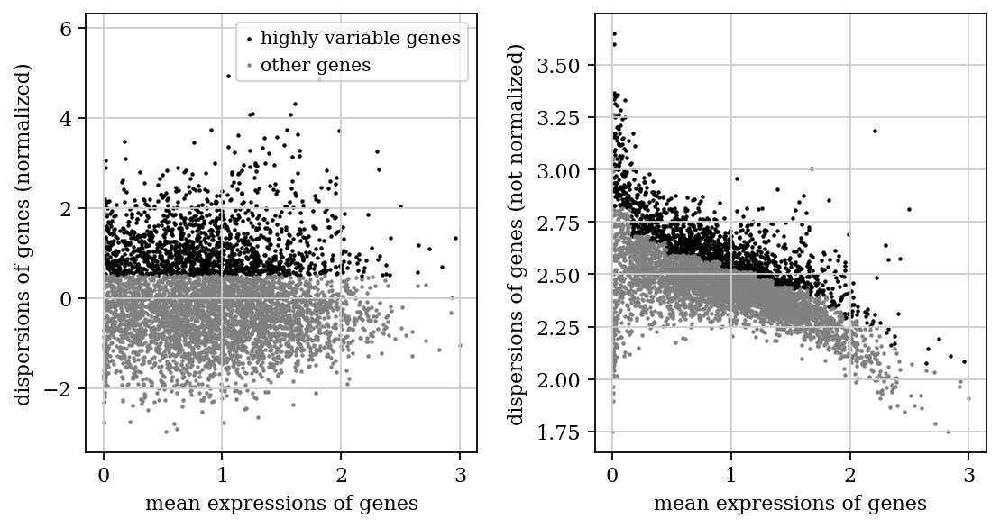

In [1220]:
sc.pp.normalize_total(ad, target_sum=1e4)
sc.pp.log1p(ad)
sc.pp.highly_variable_genes(ad, min_mean=0.0125, max_mean=3, min_disp=0.5)

sc.pl.highly_variable_genes(ad)

In [1221]:
sc.tl.pca(ad, svd_solver='arpack')

In [1222]:
sc.pp.neighbors(ad, n_neighbors=10, n_pcs=40)

In [1223]:
sc.tl.diffmap(ad)

In [1229]:
root_cells = ad.obs['annotation'] == 'C4'
root_cell_indices = np.where(root_cells)[0]
ad.uns['iroot'] = root_cell_indices[0] 

In [1230]:
sc.tl.dpt(ad)

In [1231]:
print(ad.obs['dpt_pseudotime'])

AAACCCAAGATGAATC-1    0.080062
AAACCCAGTGAATAAC-1    0.632714
AAACCCAGTGAATTAG-1    0.590667
AAACCCATCCATCTAT-1    0.639067
AAACGAAAGGCGTCCT-1    0.748103
                        ...   
TTTGTTGGTAAGGCTG-1    0.684354
TTTGTTGGTCGGTGTC-1    0.071041
TTTGTTGGTCGTGGTC-1    0.088311
TTTGTTGGTGAGTTGG-1    0.689756
TTTGTTGTCGAAGCAG-1    0.049165
Name: dpt_pseudotime, Length: 4555, dtype: float32


In [1395]:
ad.obs

,n_genes,umi_counts,louvain_1.0,louvain_0.6,louvain_0.4,louvain_1.4,clusters,S_score,G2M_score,phase,...,cell_type_marker,stage,I.Day3,I.II.Day4,II.Day5,II.III.Day6,III.IV.Day7,IV.Day8,dpt_pseudotime,mono_pseudotime
GTTGCTCTCGATAACC-1,1816,3259.8030,4,3,3,4,4,0.024129,0.024129,S,...,v,Masked,False,False,False,False,False,True,0.041821,0.000000
ATCCTATAGACTCTTG-1,1588,3045.0390,4,3,3,4,4,-0.091018,-0.091018,G1,...,+,I.Day3,True,False,False,False,False,False,0.037257,0.173356
CCCAACTAGATACATG-1,2008,3426.1035,6,3,3,5,6,0.072096,0.072096,S,...,v,Masked,False,False,False,False,False,True,0.060512,0.201561
TCTTTGAAGACCTTTG-1,1468,2910.9124,4,3,3,4,4,-0.026258,-0.026258,G1,...,x,II.Day5,False,False,True,False,False,False,0.037260,0.233278
TCTTTGAGTGAGGATC-1,1230,2638.6500,6,3,3,5,6,0.036512,0.036512,S,...,+,I.Day3,True,False,False,False,False,False,0.035456,0.243631
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTAGGCAGTATCCTTT-1,1182,2578.3652,1,1,1,0,1,-0.015271,-0.015271,G1,...,v,Masked,False,False,False,False,False,True,0.546992,27.839323
AGGCATTGTATCGCTA-1,800,2034.3064,1,1,1,0,1,0.014645,0.014645,S,...,v,Masked,False,False,False,False,False,True,0.587216,27.874853
AACCACATCTAGGCCG-1,945,2258.6104,1,1,1,0,1,-0.189472,-0.189472,G1,...,v,Masked,False,False,False,False,False,True,0.599862,27.886792
AAAGTCCGTAATGATG-1,1103,2474.8389,1,1,1,0,1,-0.149592,-0.149592,G1,...,v,Masked,False,False,False,False,False,True,0.528490,27.887016


/Users/mubashermohammed/miniconda3/envs/cellrank/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



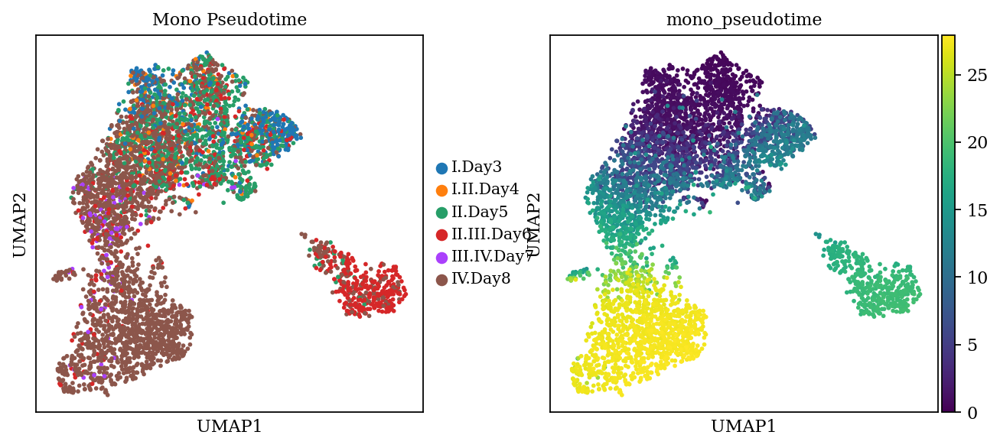

In [1396]:
#sc.pl.umap(ad, color=['stage', 'dpt_pseudotime'], cmap='viridis', title='DPT Pseudotime')
sc.pl.umap(adata, color=['stage', 'mono_pseudotime'], cmap='viridis', title='Mono Pseudotime')

In [1264]:
pseudotime_values = ad.obs['mono_pseudotime'].values

# Order cells based on pseudotime values in ascending order
ordered_indices = np.argsort(pseudotime_values)
ad = ad[ordered_indices]

In [1265]:
pseudotime_values = ad.obs['mono_pseudotime'].values

# Sort the cell_class column based on pseudotime values
sorted_indices = np.argsort(pseudotime_values)
sorted_cell_class = ad.obs['stage'].values[sorted_indices]

# Print the sorted cell_class
print(sorted_cell_class)

['IV.Day8', 'I.Day3', 'IV.Day8', 'II.Day5', 'I.Day3', ..., 'IV.Day8', 'IV.Day8', 'IV.Day8', 'IV.Day8', 'IV.Day8']
Length: 4555
Categories (6, object): ['I.Day3', 'I.II.Day4', 'II.Day5', 'II.III.Day6', 'III.IV.Day7', 'IV.Day8']


In [1257]:
mono_df = pd.read_csv('./objects/PS_values_monocle.csv', index_col=0)
mono_df

,n_genes,umi_counts,louvain_1.0,louvain_0.6,louvain_0.4,louvain_1.4,clusters,S_score,G2M_score,phase,...,num_genes_expressed,UMI,Cluster,peaks,halo,delta,rho,nearest_higher_density_neighbor,Pseudotime,State
AAACCCAAGATGAATC-1,1340,1244.13260,0,0,0,7,C0,-0.175439,-0.175439,G1,...,1340,2404,1,False,False,0.200676,77.681775,NaN,3.287154,1
AAACCCAGTGAATAAC-1,1524,1547.72020,5,5,5,11,C5,0.047093,0.047093,S,...,1524,3355,1,False,False,0.342994,74.495637,NaN,17.911051,3
AAACCCAGTGAATTAG-1,1298,1198.75590,5,5,5,11,C5,-0.022611,-0.022611,G1,...,1298,2298,1,False,False,0.303328,65.338107,NaN,17.872271,3
AAACCCATCCATCTAT-1,241,204.48782,8,1,1,10,C8,-0.067437,-0.067437,G1,...,241,352,1,False,False,0.234840,48.555695,NaN,26.904078,2
AAACGAAAGGCGTCCT-1,1192,1208.01880,5,5,5,6,C5,-0.199007,-0.199007,G1,...,1192,2613,1,False,False,0.260772,81.736768,NaN,18.683443,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTTGGTAAGGCTG-1,1305,1190.74070,5,5,5,11,C5,-0.119880,-0.119880,G1,...,1305,2225,1,False,False,0.522817,62.128726,NaN,17.328161,3
TTTGTTGGTCGGTGTC-1,808,691.76900,0,0,0,2,C0,-0.045277,-0.045277,G1,...,808,1239,1,False,False,1.436999,67.605193,NaN,3.620842,1
TTTGTTGGTCGTGGTC-1,686,627.72920,6,3,3,5,C6,-0.048457,-0.048457,G1,...,686,1148,1,False,False,0.378623,51.085427,NaN,0.848650,1
TTTGTTGGTGAGTTGG-1,1728,1836.92050,5,5,5,11,C5,-0.009218,-0.009218,G1,...,1728,4134,1,False,False,0.140923,72.532381,NaN,18.254232,3


In [1258]:
ad.obs['mono_pseudotime'] = mono_df['Pseudotime']

/var/folders/h5/cwp4w7cd35554f006psf_z9w0000gn/T/ipykernel_73233/1449592647.py:1: ImplicitModificationWarning:

Trying to modify attribute `.obs` of view, initializing view as actual.



In [1267]:
ad.obs

,n_genes,umi_counts,louvain_1.0,louvain_0.6,louvain_0.4,louvain_1.4,clusters,S_score,G2M_score,phase,...,cell_type_marker,stage,I.Day3,I.II.Day4,II.Day5,II.III.Day6,III.IV.Day7,IV.Day8,dpt_pseudotime,mono_pseudotime
GTTGCTCTCGATAACC-1,1816,3259.8030,4,3,3,4,4,0.024129,0.024129,S,...,v,IV.Day8,False,False,False,False,False,True,0.041821,0.000000
ATCCTATAGACTCTTG-1,1588,3045.0390,4,3,3,4,4,-0.091018,-0.091018,G1,...,+,I.Day3,True,False,False,False,False,False,0.037257,0.173356
CCCAACTAGATACATG-1,2008,3426.1035,6,3,3,5,6,0.072096,0.072096,S,...,v,IV.Day8,False,False,False,False,False,True,0.060512,0.201561
TCTTTGAAGACCTTTG-1,1468,2910.9124,4,3,3,4,4,-0.026258,-0.026258,G1,...,x,II.Day5,False,False,True,False,False,False,0.037260,0.233278
TCTTTGAGTGAGGATC-1,1230,2638.6500,6,3,3,5,6,0.036512,0.036512,S,...,+,I.Day3,True,False,False,False,False,False,0.035456,0.243631
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTAGGCAGTATCCTTT-1,1182,2578.3652,1,1,1,0,1,-0.015271,-0.015271,G1,...,v,IV.Day8,False,False,False,False,False,True,0.546992,27.839323
AGGCATTGTATCGCTA-1,800,2034.3064,1,1,1,0,1,0.014645,0.014645,S,...,v,IV.Day8,False,False,False,False,False,True,0.587216,27.874853
AACCACATCTAGGCCG-1,945,2258.6104,1,1,1,0,1,-0.189472,-0.189472,G1,...,v,IV.Day8,False,False,False,False,False,True,0.599862,27.886792
AAAGTCCGTAATGATG-1,1103,2474.8389,1,1,1,0,1,-0.149592,-0.149592,G1,...,v,IV.Day8,False,False,False,False,False,True,0.528490,27.887016


In [1325]:
cell_type_to_rename = 'IV.Day8'  # Cell type to rename
new_cell_type = 'III.IV.Day7'  # New name for the cell type

adata.obs['stage'] = adata.obs['stage'].replace(cell_type_to_rename, new_cell_type)

In [1379]:
cell_types = ['I.Day3', 'I.II.Day4', 'II.Day5', 'II.III.Day6', 'III.IV.Day7']

# Create a boolean mask indicating which cells have the specified cell types
mask = adata.obs['stage'].isin(cell_types)

# Subset the adata object using the mask
subset_adata = adata[mask, :]

In [1397]:
subset_adata.obs['stage']

ATCCTATAGACTCTTG-1         I.Day3
TCTTTGAAGACCTTTG-1        II.Day5
TCTTTGAGTGAGGATC-1         I.Day3
AGGGCTCCAGGACTTT-1        II.Day5
CTACAGATCATCGCAA-1        II.Day5
                         ...     
GCTGGGTAGGTTCTTG-1    II.III.Day6
GTAGAAACAAAGTATG-1    II.III.Day6
TCAAGACGTTAATCGC-1    III.IV.Day7
CGGAATTAGTCTAGCT-1    III.IV.Day7
ACGGAAGTCATTGCTT-1    III.IV.Day7
Name: stage, Length: 1981, dtype: category
Categories (5, object): ['I.Day3', 'I.II.Day4', 'II.Day5', 'II.III.Day6', 'III.IV.Day7']

/var/folders/h5/cwp4w7cd35554f006psf_z9w0000gn/T/ipykernel_73233/574215676.py:8: UserWarning:

FixedFormatter should only be used together with FixedLocator



[Text(-10.0, 0, '−10'),
 Text(-5.0, 0, '−5'),
 Text(0.0, 0, '0'),
 Text(5.0, 0, '5'),
 Text(10.0, 0, '10'),
 Text(15.0, 0, '15'),
 Text(20.0, 0, '20'),
 Text(25.0, 0, '25'),
 Text(30.0, 0, '30'),
 Text(35.0, 0, '35')]

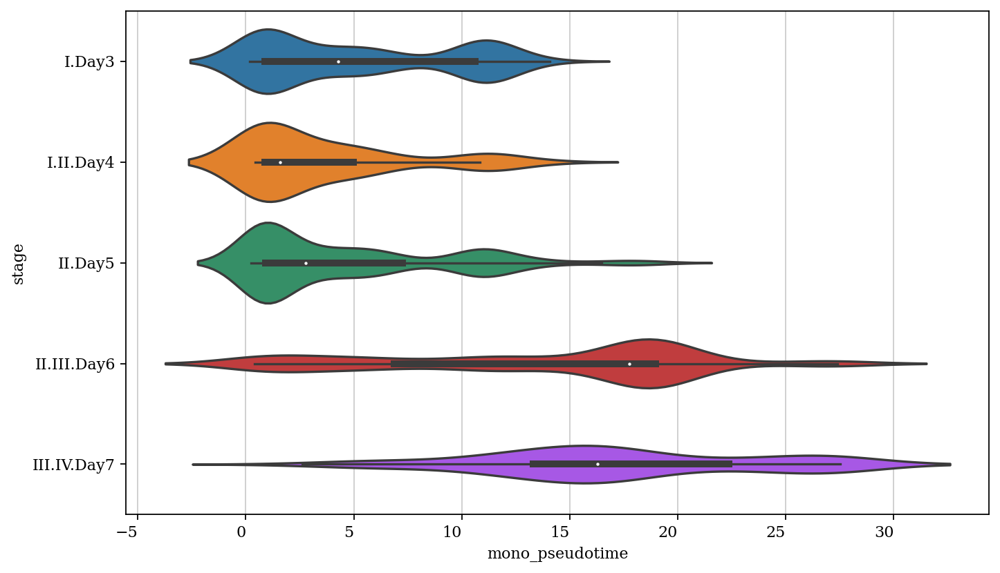

In [1376]:
sc.settings.set_figure_params(dpi_save=400, fontsize=10, facecolor='white', frameon=True, transparent=True, format="png")

fig, ax = plt.subplots(figsize=(10, 6))
plt.rc('font', size=6)
ax.set_axisbelow(True)
ax = sns.violinplot(y=subset_adata.obs['stage'], x=subset_adata.obs['mono_pseudotime'])

ax.set_xticklabels(ax.get_xticklabels(), rotation=0, horizontalalignment='right')
#plt.savefig("./figures/ps_stgae_v1.png", dpi=400, facecolor='w', edgecolor='w',
 #         orientation='portrait', transparent=True, metadata=None)


/var/folders/h5/cwp4w7cd35554f006psf_z9w0000gn/T/ipykernel_73233/704264236.py:8: UserWarning:

FixedFormatter should only be used together with FixedLocator



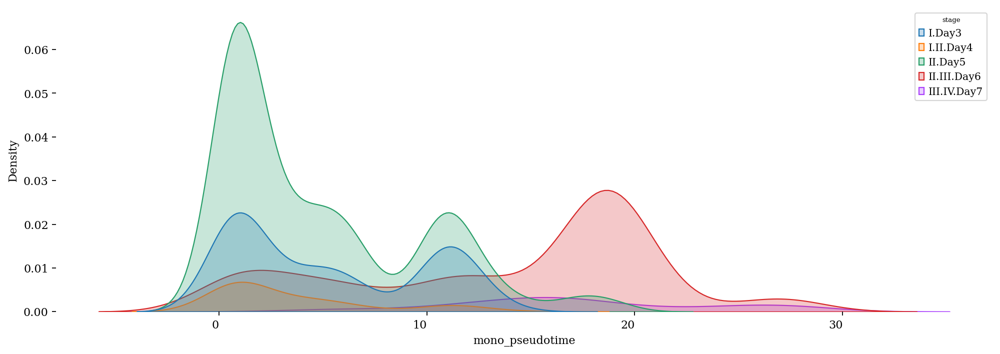

In [1398]:
sc.settings.set_figure_params(dpi_save=400, fontsize=10, facecolor='white', frameon=True, transparent=True, format="png")

fig, ax = plt.subplots(figsize=(15, 5))
plt.rc('font', size=6)

sns.kdeplot(data=subset_adata.obs, x='mono_pseudotime', hue=subset_adata.obs['stage'], fill=True, ax=ax)
#ax.set_xscale('log')
ax.set_xticklabels(ax.get_xticklabels(), rotation=0, horizontalalignment='right')
ax.grid(False)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set_visible(False)

/var/folders/h5/cwp4w7cd35554f006psf_z9w0000gn/T/ipykernel_73233/1219334120.py:11: UserWarning:

FixedFormatter should only be used together with FixedLocator



[Text(-5.0, 0, '−5'),
 Text(0.0, 0, '0'),
 Text(5.0, 0, '5'),
 Text(10.0, 0, '10'),
 Text(15.0, 0, '15'),
 Text(20.0, 0, '20'),
 Text(25.0, 0, '25'),
 Text(30.0, 0, '30')]

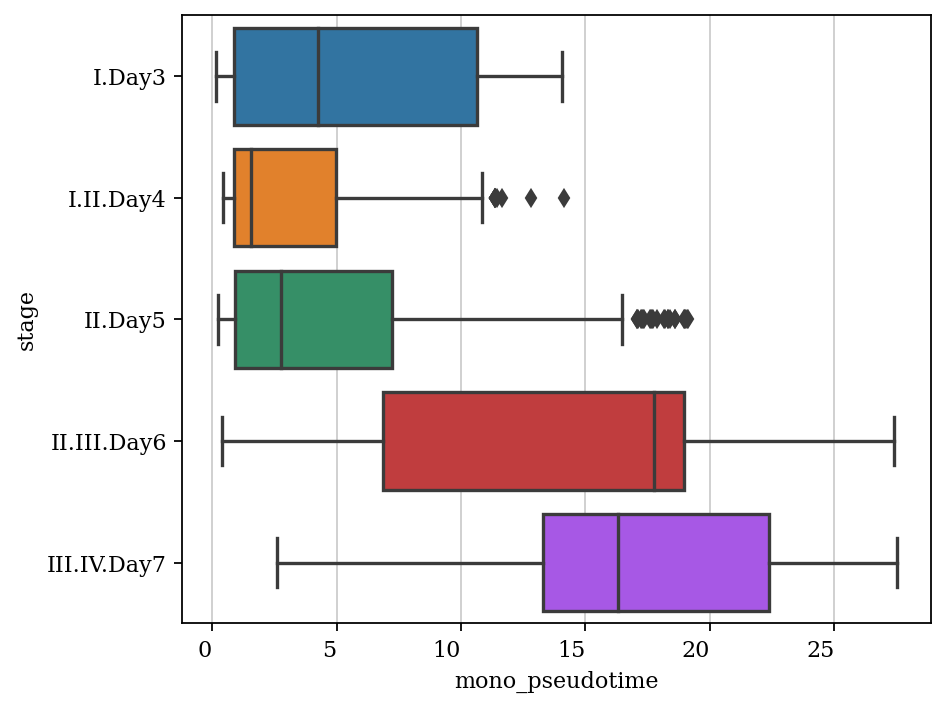

In [1365]:
sc.settings.set_figure_params(dpi_save=400, fontsize=10, facecolor='white', frameon=True, transparent=True, format="png")

# Convert ad.obs['stage'] to categorical
#ad.obs['stage'] = ad.obs['stage'].astype('category')

fig, ax = plt.subplots(figsize=(6, 5))
plt.rc('font', size=6)
ax.set_axisbelow(True)
ax = sns.boxplot(y=subset_adata.obs['stage'], x=subset_adata.obs['mono_pseudotime'],
                 )
ax.set_xticklabels(ax.get_xticklabels(), rotation=0, horizontalalignment='right')

#plt.savefig("./figures/latent_time_clusters_v1.png", dpi=400, facecolor='w', edgecolor='w',
 #           orientation='portrait', transparent=True, metadata=None)

[Text(0, 0, 'Early gametocyte'),
 Text(1, 0, 'Female lineage'),
 Text(2, 0, 'Male lineage')]

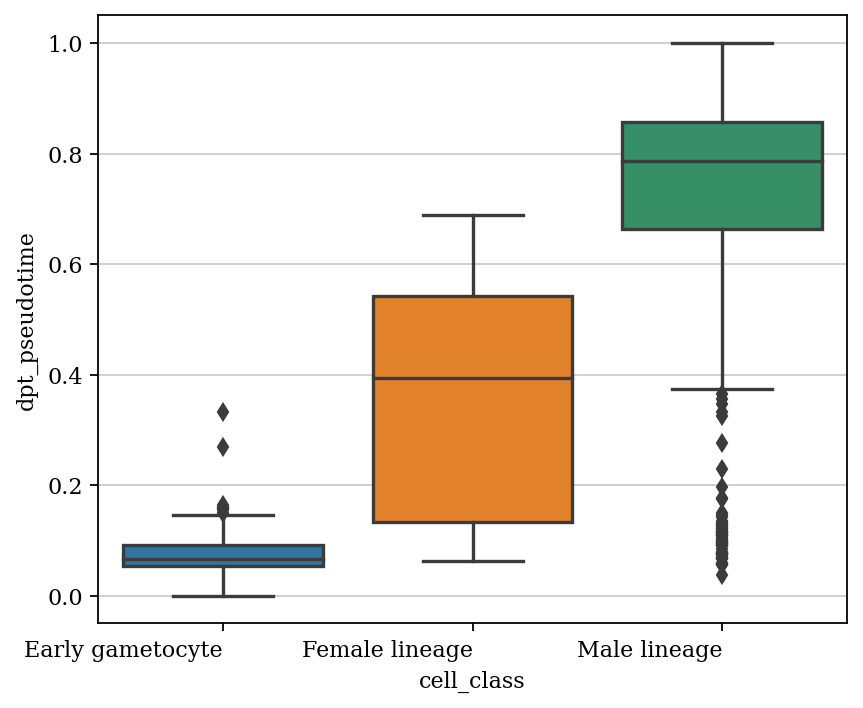

In [1185]:
sc.settings.set_figure_params(dpi_save= 400, fontsize=10, facecolor='white', frameon=True, transparent=True, format="png")
fig, ax = plt.subplots(figsize=(6, 5))
#plt.grid(b=None)
plt.rc('font', size=6)
ax.set_axisbelow(True)
ax = sns.boxplot(x=ad.obs['cell_class'], y=ad.obs['dpt_pseudotime'],order=["Early gametocyte", "Female lineage", "Male lineage", 
            ], data=ad.obs, )
ax.set_xticklabels(ax.get_xticklabels(), rotation=0, horizontalalignment='right')
#plt.savefig("./figures/latent_time_clusters_v1.png", facecolor='w', edgecolor='w',
#        orientation='potrait', format="png",
#        transparent=True, metadata=None) "IV.Day8"

In [665]:
concatenated_adata = adata.concatenate(adata_bulk)

# Print the concatenated AnnData object
print(concatenated_adata)

AnnData object with n_obs × n_vars = 4562 × 4461
    obs: 'n_genes', 'umi_counts', 'louvain_1.0', 'louvain_0.6', 'louvain_0.4', 'louvain_1.4', 'clusters', 'S_score', 'G2M_score', 'phase', 'male_signature', 'female_signature', 'cell_class', 'annotation', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'imcs_score', 'Regulon.PF3D7_0420300....', 'Regulon.PF3D7_1107800....', 'Regulon.PF3D7_1139300....', 'Regulon.PF3D7_1139300.....1', 'Regulon.PF3D7_1222400....', 'Regulon.PF3D7_1239200....', 'Regulon.PF3D7_1350900....', 'Regulon.PF3D7_1408200....', 'pruned_labels', 'bulk_labels', 'first_labels', 'frist_labels', 'Batch', 'Time_course', 'n_counts', 'batch'
    var: 'highly_variable', 'gene_ids-0', 'feature_types-0', 'genome-0', 'mt-0', 'ribo-0', 'hb-0', 'n_cells-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'n_cells_by_counts-0', 'mean_counts-0', 'pct_dropout_by_counts-0', 'total_count

/Users/mubashermohammed/miniconda3/envs/cellrank/lib/python3.8/site-packages/anndata/_core/merge.py:1111: UserWarning:

Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.



/Users/mubashermohammed/miniconda3/envs/cellrank/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



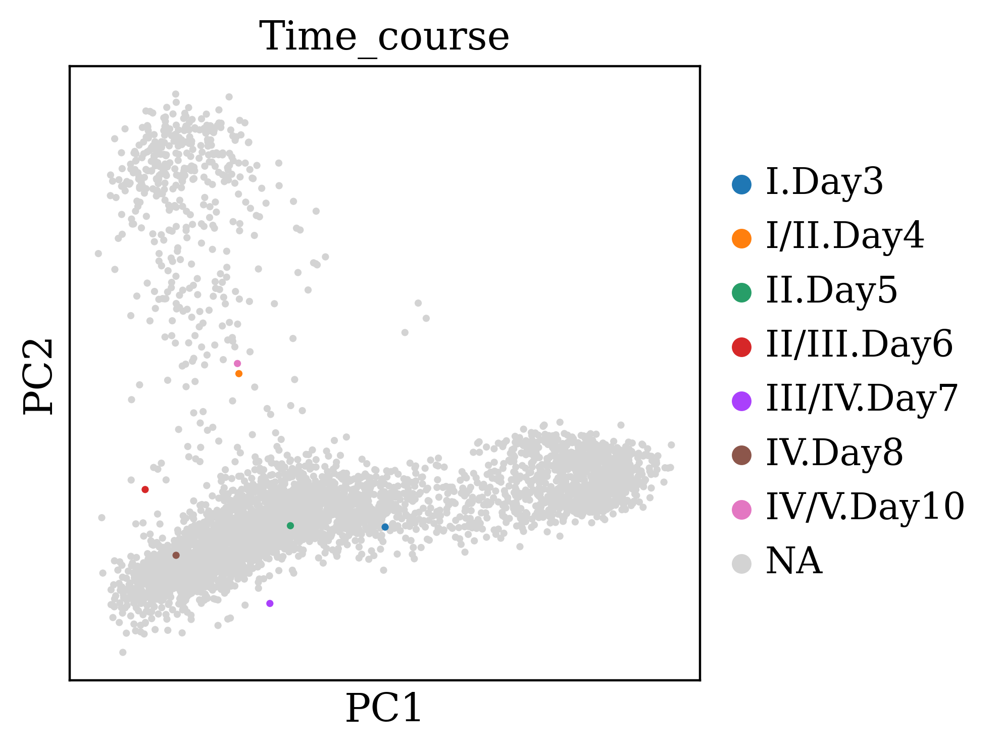

In [670]:
sc.pl.pca(concatenated_adata, color ='Time_course')

In [671]:
adatas = [adata, adata_bulk]

# Print the list of AnnData objects
print(adatas)

[View of AnnData object with n_obs × n_vars = 4555 × 5000
    obs: 'n_genes', 'umi_counts', 'louvain_1.0', 'louvain_0.6', 'louvain_0.4', 'louvain_1.4', 'clusters', 'S_score', 'G2M_score', 'phase', 'male_signature', 'female_signature', 'cell_class', 'annotation', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'imcs_score', 'Regulon.PF3D7_0420300....', 'Regulon.PF3D7_1107800....', 'Regulon.PF3D7_1139300....', 'Regulon.PF3D7_1139300.....1', 'Regulon.PF3D7_1222400....', 'Regulon.PF3D7_1239200....', 'Regulon.PF3D7_1350900....', 'Regulon.PF3D7_1408200....', 'pruned_labels', 'bulk_labels', 'first_labels', 'frist_labels', 'Batch'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'ribo', 'hb', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'Regulon(PF3D7_0420300 (+))', 'Regulon(PF3D7_1107

In [673]:
scanorama.integrate_scanpy(
    adatas        = adatas,
    dimred        = 50)

Found 4461 genes among all datasets
[[0. 1.]
 [0. 0.]]
Processing datasets (0, 1)


In [674]:
adatas[0].obsm['X_scanorama'].shape

scanorama_int = [ad.obsm['X_scanorama'] for ad in adatas]
all_s = np.concatenate(scanorama_int)
concatenated_adata.obsm["scanorama"] = all_s

/Users/mubashermohammed/miniconda3/envs/cellrank/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



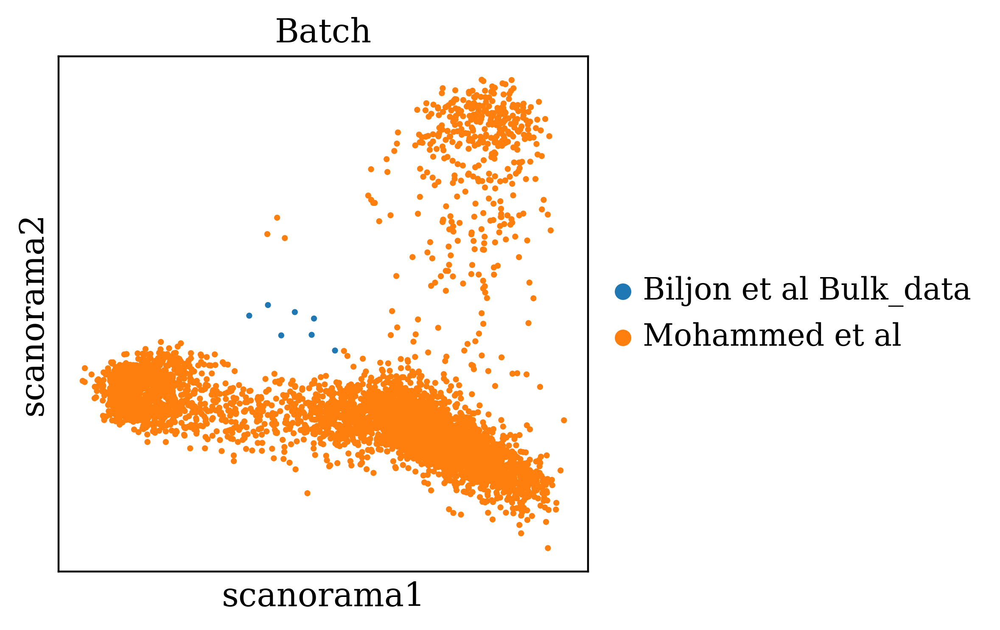

In [675]:
sc.pl.embedding(
    basis='scanorama',
    adata = concatenated_adata,
    color='Batch', 
    components = ['1,2'], 
    ncols=2)

In [5]:
bulk_df = pd.DataFrame(adata_bulk.X, columns=adata_bulk.var_names, index=adata_bulk.obs['Time_course'])
bulk_df

GeneID,PF3D7_0100900,PF3D7_0101500,PF3D7_0102200,PF3D7_0108500,PF3D7_0113300,PF3D7_0113900,PF3D7_0114100,PF3D7_0114500,PF3D7_0114600,PF3D7_0200900,...,PFC10_API0026:tRNA,PFC10_API0045:tRNA,PFC10_API0046:tRNA,PFC10_API0047:tRNA,PFC10_API0048:tRNA,PFC10_API0049:tRNA,PFC10_API0050:tRNA,PFC10_API0053:tRNA,PFC10_API0055,PFC10_API0058:tRNA
Time_course,,,,,,,,,,,,,,,,,,,,,
I.Day3,0.289599,0.457919,0.489289,0.539428,0.584097,0.455378,0.330184,0.390910,0.723420,0.399966,...,1.129373,1.055680,1.082993,0.883839,1.011033,1.235071,1.345562,1.220369,1.043659,1.172015
I/II.Day4,0.424416,0.523554,0.175782,0.323315,0.317614,0.243396,0.378613,0.383003,0.623178,0.639400,...,0.682980,0.821986,0.655922,1.043659,1.043659,0.693325,0.546528,1.043659,1.043659,0.693325
II.Day5,0.379480,0.521851,0.337743,0.337743,0.399603,0.437511,0.657245,0.847077,0.379480,0.439973,...,1.082266,0.773969,0.719293,0.726427,0.751775,1.100683,1.200136,0.698178,0.883193,0.843122
II/III.Day6,0.788698,0.592606,0.454771,0.547449,0.312585,0.504928,0.434863,0.637162,0.207529,0.240886,...,0.957901,0.834932,0.624193,0.773667,0.722565,1.072752,0.834932,0.640434,0.953635,0.769939
III/IV.Day7,0.280112,0.472038,0.357350,0.378686,0.343016,0.436621,0.456592,0.540811,0.310207,0.378686,...,1.026437,0.914581,0.952434,0.826008,0.965257,1.026437,1.141031,1.094388,1.066915,1.112918
IV.Day8,0.877555,0.422041,0.935384,0.683004,0.383019,0.532102,0.266803,0.288645,0.199478,0.121740,...,0.914471,0.795111,0.645996,0.649300,0.810413,1.004219,0.721465,0.549473,0.897948,0.743056
IV/V.Day10,0.653187,0.488278,0.547049,0.736430,0.257488,0.216618,0.357651,0.704403,0.722076,1.072127,...,0.803394,0.830477,0.822680,0.532592,0.595285,0.567780,0.353503,0.427248,0.669959,0.915183


In [6]:
expression_df = pd.read_csv('/Users/mubashermohammed/Desktop/Gomesetal/Bulk_Biljion/matrix.tsv', index_col=0)

# Transpose the DataFrame to have cells as rows and genes as columns
expression_df = expression_df.T

# Print the resulting DataFrame
expression_df

,PF3D7_1401000,PF3D7_1401100,PF3D7_1401200,PF3D7_1401300,PF3D7_1401400,PF3D7_1401500,PF3D7_1401600,PF3D7_1401700,PF3D7_1401800,PF3D7_1401900,...,PF3D7_0113400,PF3D7_0113700,PF3D7_0113800,PF3D7_0113900,PF3D7_0114000,PF3D7_0114500,PF3D7_0115000,PF3D7_0115100,PF3D7_0115600,PF3D7_0115700
AAACCCAAGATGAATC-1,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,...,0.000000,0.0,0.0,0.0,2.634491,0.0,0.0,0.0,0.0,0.0
AAACCCAGTGAATAAC-1,0.0,0.0,0.0,0.0,0.0,0.0,2.298277,0.0,0.000000,2.531851,...,0.000000,0.0,0.0,0.0,2.091649,0.0,0.0,0.0,0.0,0.0
AAACCCAGTGAATTAG-1,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,1.914305,2.669025,...,0.000000,0.0,0.0,0.0,1.914305,0.0,0.0,0.0,0.0,0.0
AAACCCATCCATCTAT-1,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,...,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0
AAACGAAAGGCGTCCT-1,0.0,0.0,0.0,0.0,0.0,0.0,1.907746,0.0,0.000000,2.762047,...,0.000000,0.0,0.0,0.0,1.907746,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTTGGTAAGGCTG-1,0.0,0.0,0.0,0.0,0.0,0.0,2.537047,0.0,0.000000,2.775549,...,1.920027,0.0,0.0,0.0,2.675271,0.0,0.0,0.0,0.0,0.0
TTTGTTGGTCGGTGTC-1,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,...,0.000000,0.0,0.0,0.0,2.399705,0.0,0.0,0.0,0.0,0.0
TTTGTTGGTCGTGGTC-1,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,...,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0
TTTGTTGGTGAGTTGG-1,0.0,0.0,0.0,0.0,0.0,0.0,1.563063,0.0,0.000000,1.563063,...,0.000000,0.0,0.0,0.0,2.278457,0.0,0.0,0.0,0.0,0.0


In [9]:
expression_df.index = adata.obs.loc[expression_df.index, 'annotation']

In [13]:
#print(expression_df, bulk_df)
#expression_df
expression_df

In [360]:
import scanpy as sc
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from scipy import stats

In [363]:
ad = ad.AnnData(expression_df, obs = adata.obs)

In [364]:
ad

AnnData object with n_obs × n_vars = 4555 × 5019
    obs: 'n_genes', 'umi_counts', 'louvain_1.0', 'louvain_0.6', 'louvain_0.4', 'louvain_1.4', 'clusters', 'S_score', 'G2M_score', 'phase', 'male_signature', 'female_signature', 'cell_class', 'annotation', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'imcs_score', 'Regulon.PF3D7_0420300....', 'Regulon.PF3D7_1107800....', 'Regulon.PF3D7_1139300....', 'Regulon.PF3D7_1139300.....1', 'Regulon.PF3D7_1222400....', 'Regulon.PF3D7_1239200....', 'Regulon.PF3D7_1350900....', 'Regulon.PF3D7_1408200....', 'pruned_labels', 'bulk_labels', 'first_labels', 'frist_labels', 'Batch', 'Time_course'

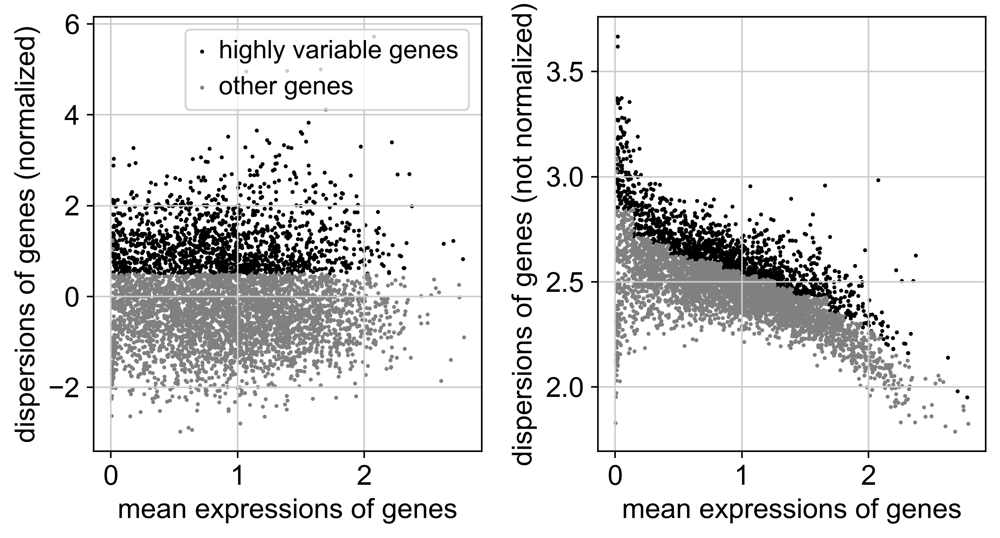

In [32]:
sc.pp.normalize_total(ad, target_sum=1e4)
sc.pp.log1p(ad)
sc.pp.highly_variable_genes(ad, min_mean=0.0125, max_mean=3, min_disp=0.5)
sc.pl.highly_variable_genes(ad)
ad = ad[:, ad.var['highly_variable']]

In [18]:
bulk_normalized = (bulk_df - bulk_df.mean()) / bulk_df.std() 

In [78]:
sc_normalized = (expression_df - expression_df.mean()) / expression_df.std()

In [80]:
sc_normalized

,PF3D7_1401000,PF3D7_1401100,PF3D7_1401200,PF3D7_1401300,PF3D7_1401400,PF3D7_1401500,PF3D7_1401600,PF3D7_1401700,PF3D7_1401800,PF3D7_1401900,...,PF3D7_0113400,PF3D7_0113700,PF3D7_0113800,PF3D7_0113900,PF3D7_0114000,PF3D7_0114500,PF3D7_0115000,PF3D7_0115100,PF3D7_0115600,PF3D7_0115700
AAACCCAAGATGAATC-1,-0.02561,-0.046217,-0.038593,-0.325689,-0.143497,-0.111726,-0.634995,-0.082356,-0.437784,-0.972539,...,-0.325844,-0.150141,-0.075784,-0.09469,0.374491,-0.050879,-0.061812,-0.095627,-0.025491,-0.07751
AAACCCAGTGAATAAC-1,-0.02561,-0.046217,-0.038593,-0.325689,-0.143497,-0.111726,1.236162,-0.082356,-0.437784,0.745608,...,-0.325844,-0.150141,-0.075784,-0.09469,0.238000,-0.050879,-0.061812,-0.095627,-0.025491,-0.07751
AAACCCAGTGAATTAG-1,-0.02561,-0.046217,-0.038593,-0.325689,-0.143497,-0.111726,-0.634995,-0.082356,1.971279,0.850813,...,-0.325844,-0.150141,-0.075784,-0.09469,0.301890,-0.050879,-0.061812,-0.095627,-0.025491,-0.07751
AAACCCATCCATCTAT-1,-0.02561,-0.046217,-0.038593,-0.325689,-0.143497,-0.111726,-0.634995,-0.082356,-0.437784,-0.972539,...,-0.325844,-0.150141,-0.075784,-0.09469,-1.404185,-0.050879,-0.061812,-0.095627,-0.025491,-0.07751
AAACGAAAGGCGTCCT-1,-0.02561,-0.046217,-0.038593,-0.325689,-0.143497,-0.111726,1.336274,-0.082356,-0.437784,0.913828,...,-0.325844,-0.150141,-0.075784,-0.09469,0.354694,-0.050879,-0.061812,-0.095627,-0.025491,-0.07751
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTTGGTAAGGCTG-1,-0.02561,-0.046217,-0.038593,-0.325689,-0.143497,-0.111726,1.363666,-0.082356,-0.437784,0.857939,...,2.553775,-0.150141,-0.075784,-0.09469,0.393759,-0.050879,-0.061812,-0.095627,-0.025491,-0.07751
TTTGTTGGTCGGTGTC-1,-0.02561,-0.046217,-0.038593,-0.325689,-0.143497,-0.111726,-0.634995,-0.082356,-0.437784,-0.972539,...,-0.325844,-0.150141,-0.075784,-0.09469,0.657676,-0.050879,-0.061812,-0.095627,-0.025491,-0.07751
TTTGTTGGTCGTGGTC-1,-0.02561,-0.046217,-0.038593,-0.325689,-0.143497,-0.111726,-0.634995,-0.082356,-0.437784,-0.972539,...,-0.325844,-0.150141,-0.075784,-0.09469,-1.404185,-0.050879,-0.061812,-0.095627,-0.025491,-0.07751
TTTGTTGGTGAGTTGG-1,-0.02561,-0.046217,-0.038593,-0.325689,-0.143497,-0.111726,1.029286,-0.082356,-0.437784,0.530909,...,-0.325844,-0.150141,-0.075784,-0.09469,0.195000,-0.050879,-0.061812,-0.095627,-0.025491,-0.07751


In [82]:
shared_genes = np.intersect1d(ad.var_names, bulk_normalized.columns)
#sc_expression_shared = ad[:, shared_genes].X
sc_expression_shared = sc_normalized[shared_genes]
bulk_expression_shared = bulk_normalized[shared_genes]

In [91]:
sc_expression_shared = pd.DataFrame(sc_expression_shared, index=ad.obs_names, columns=shared_genes)
bulk_expression_shared = pd.DataFrame(bulk_expression_shared, index=bulk_normalized.index, columns=shared_genes)


In [110]:
def calculate_cell_type_proportions(ad):
    # Example: randomly assign proportions
    n_cells = ad.shape[0]
    n_cell_types = 4555
    proportions = pd.DataFrame(np.random.rand(n_cells, n_cell_types), index=ad.obs_names)
    return proportions

In [111]:
cell_type_proportions_sc = calculate_cell_type_proportions(ad)

In [119]:
deconvolution_model = LinearRegression()
deconvolution_model.fit(sc_expression_shared, cell_type_proportions_sc.T)


LinearRegression()

In [130]:
cell_type_proportions_bulk = deconvolution_model.predict(bulk_expression_shared)


In [145]:
cell_type_proportions_bulk = pd.DataFrame(cell_type_proportions_bulk.T, index=cell_type_proportions_sc.index)


In [149]:
cell_type_proportions_bulk = cell_type_proportions_bulk.T

In [158]:
cell_type_proportions_bulk = bulk_expression_shared.index
cell_type_proportions_bulk

,AAACCCAAGATGAATC-1,AAACCCAGTGAATAAC-1,AAACCCAGTGAATTAG-1,AAACCCATCCATCTAT-1,AAACGAAAGGCGTCCT-1,AAACGAACAGCAGTGA-1,AAACGAACAGCGAGTA-1,AAACGAACAGGCTCTG-1,AAACGAACATCATCCC-1,AAACGAAGTAGACGGT-1,...,TTTGGTTCATACTGTG-1,TTTGGTTGTAGCTTGT-1,TTTGTTGAGCACTGGA-1,TTTGTTGAGCCTCATA-1,TTTGTTGCAGCTGTAT-1,TTTGTTGGTAAGGCTG-1,TTTGTTGGTCGGTGTC-1,TTTGTTGGTCGTGGTC-1,TTTGTTGGTGAGTTGG-1,TTTGTTGTCGAAGCAG-1
Time_course,,,,,,,,,,,,,,,,,,,,,
I.Day3,0.688823,0.269530,0.365228,0.394199,0.211749,0.384882,0.717706,0.215844,0.644906,0.264831,...,0.577756,0.562080,0.442784,0.290654,0.418851,0.709656,0.182173,0.549672,0.655330,0.683830
I/II.Day4,0.452727,0.239990,0.629425,0.372125,0.664460,0.442913,0.687866,0.424509,0.685133,0.499608,...,0.358476,0.440770,0.433656,0.313776,0.734083,0.287566,0.607747,0.266182,0.264422,0.434507
II.Day5,0.499935,0.476024,0.450221,0.410061,0.384318,0.239171,0.563203,0.544231,0.513445,0.144768,...,0.520878,0.506471,0.352737,0.447623,0.432414,0.426257,0.561026,0.719496,0.730991,0.554919
II/III.Day6,0.448412,0.481065,0.626954,0.507262,0.507830,0.454476,0.243371,0.584353,0.593255,0.473258,...,0.380697,0.645775,0.505144,0.559664,0.497226,0.252858,0.445958,0.446691,0.278795,0.547806
III/IV.Day7,0.637245,0.607951,0.253192,0.515579,0.289555,0.522123,0.517717,0.517661,0.371381,0.285535,...,0.704077,0.484084,0.364407,0.512346,0.623892,0.619825,0.590050,0.416997,0.658198,0.432657
IV.Day8,0.410237,0.903299,0.425042,0.665669,0.719530,0.777399,0.236417,0.537215,0.252325,0.996443,...,0.573727,0.350782,0.884886,0.713777,0.238253,0.733055,0.564925,0.620697,0.381830,0.224760
IV/V.Day10,0.350512,0.493620,0.789948,0.591385,0.691909,0.671309,0.531853,0.672039,0.418950,0.835663,...,0.376624,0.539068,0.496647,0.683102,0.568284,0.403529,0.566019,0.522270,0.504856,0.589374


In [218]:
cell_type_proportions_sc

,0,1,2,3,4,5,6,7,8,9,...,4545,4546,4547,4548,4549,4550,4551,4552,4553,4554
AAACCCAAGATGAATC-1,0.527060,0.204013,0.784300,0.435736,0.498641,0.920203,0.844731,0.876214,0.383013,0.951875,...,0.950278,0.889359,0.354587,0.341163,0.879785,0.046522,0.524219,0.179575,0.387129,0.494325
AAACCCAGTGAATAAC-1,0.228137,0.532141,0.547146,0.136667,0.317703,0.180220,0.080206,0.647585,0.103119,0.564842,...,0.111848,0.472468,0.159369,0.873785,0.771166,0.841648,0.289695,0.599503,0.748224,0.190699
AAACCCAGTGAATTAG-1,0.671327,0.307728,0.855427,0.180542,0.258005,0.023584,0.538437,0.138169,0.171230,0.033723,...,0.153157,0.489095,0.953204,0.694911,0.314188,0.525715,0.006471,0.051843,0.847465,0.802228
AAACCCATCCATCTAT-1,0.288479,0.718975,0.551996,0.951680,0.362889,0.273086,0.282683,0.807634,0.759836,0.267954,...,0.101296,0.779840,0.459399,0.440961,0.558354,0.336064,0.642577,0.901166,0.744294,0.311521
AAACGAAAGGCGTCCT-1,0.858705,0.221090,0.925836,0.065404,0.124065,0.860811,0.121206,0.093350,0.596832,0.309354,...,0.088568,0.245323,0.702552,0.503636,0.111482,0.503678,0.285508,0.771703,0.183206,0.134986
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTTGGTAAGGCTG-1,0.152473,0.682776,0.825092,0.896082,0.811574,0.323459,0.754074,0.756057,0.836098,0.317310,...,0.314206,0.247442,0.411078,0.386049,0.391976,0.686871,0.321696,0.840426,0.699445,0.875896
TTTGTTGGTCGGTGTC-1,0.326156,0.300087,0.489429,0.640365,0.816962,0.586943,0.652587,0.042945,0.545221,0.416237,...,0.646877,0.704263,0.255187,0.962249,0.553374,0.046531,0.708007,0.048395,0.109502,0.926640
TTTGTTGGTCGTGGTC-1,0.957467,0.777200,0.735251,0.075155,0.666556,0.541240,0.560429,0.908823,0.586472,0.140237,...,0.273825,0.506630,0.197532,0.056025,0.643713,0.022760,0.985459,0.507569,0.146413,0.061862
TTTGTTGGTGAGTTGG-1,0.323289,0.728501,0.609305,0.998884,0.027478,0.721350,0.399044,0.545352,0.260123,0.070818,...,0.458565,0.485459,0.751488,0.959758,0.975838,0.169721,0.930918,0.676954,0.209763,0.049278


In [190]:
cell_type_prop_bulk =  cell_type_proportions_bulk.T

In [1142]:
cell_prop = cell_type_prop_bulk
cell_prop

Time_course,I.Day3,I/II.Day4,II.Day5,II/III.Day6,III/IV.Day7,IV.Day8,IV/V.Day10,Annotation_Group
C0,0.688823,0.452727,0.499935,0.448412,0.637245,0.410237,0.350512,C0
C5,0.269530,0.239990,0.476024,0.481065,0.607951,0.903299,0.493620,C5
C5,0.365228,0.629425,0.450221,0.626954,0.253192,0.425042,0.789948,C5
C8,0.394199,0.372125,0.410061,0.507262,0.515579,0.665669,0.591385,C8
C5,0.211749,0.664460,0.384318,0.507830,0.289555,0.719530,0.691909,C5
...,...,...,...,...,...,...,...,...
C5,0.709656,0.287566,0.426257,0.252858,0.619825,0.733055,0.403529,C5
C0,0.182173,0.607747,0.561026,0.445958,0.590050,0.564925,0.566019,C0
C6,0.549672,0.266182,0.719496,0.446691,0.416997,0.620697,0.522270,C6
C5,0.655330,0.264422,0.730991,0.278795,0.658198,0.381830,0.504856,C5


In [294]:
row_name_map = dict(zip(adata.obs_names, adata.obs['annotation']))

# Replace the row names in the data frame with 'annotation' values
cell_prop.index = cell_prop.index.map(row_name_map)

In [221]:
subset_df = cell_type_prop_bulk[cell_type_prop_bulk > 0].dropna()

In [1249]:
#cell_type_proportions_bulk
cell_prop

Time_course,I.Day3,I/II.Day4,II.Day5,II/III.Day6,III/IV.Day7,IV.Day8,IV/V.Day10,Annotation_Group
C0,0.688823,0.452727,0.499935,0.448412,0.637245,0.410237,0.350512,C0
C5,0.269530,0.239990,0.476024,0.481065,0.607951,0.903299,0.493620,C5
C5,0.365228,0.629425,0.450221,0.626954,0.253192,0.425042,0.789948,C5
C8,0.394199,0.372125,0.410061,0.507262,0.515579,0.665669,0.591385,C8
C5,0.211749,0.664460,0.384318,0.507830,0.289555,0.719530,0.691909,C5
...,...,...,...,...,...,...,...,...
C5,0.709656,0.287566,0.426257,0.252858,0.619825,0.733055,0.403529,C5
C0,0.182173,0.607747,0.561026,0.445958,0.590050,0.564925,0.566019,C0
C6,0.549672,0.266182,0.719496,0.446691,0.416997,0.620697,0.522270,C6
C5,0.655330,0.264422,0.730991,0.278795,0.658198,0.381830,0.504856,C5


In [668]:
#cell_prop.to_csv('/Users/mubashermohammed/Desktop/Gomesetal/Bulk_Biljion/cell_type_prop_bulk_annotation_group.csv', index=True)

In [312]:
correlation_matrix = cell_prop.corr(method='spearman')

# Print the correlation matrix
correlation_matrix

Time_course,I.Day3,I/II.Day4,II.Day5,II/III.Day6,III/IV.Day7,IV.Day8,IV/V.Day10
Time_course,,,,,,,
I.Day3,1.000000,-0.158302,0.154365,-0.358524,0.049041,-0.176109,-0.389288
I/II.Day4,-0.158302,1.000000,-0.297153,-0.086782,-0.478073,-0.472695,0.382773
II.Day5,0.154365,-0.297153,1.000000,-0.141069,0.351389,-0.291020,-0.424546
II/III.Day6,-0.358524,-0.086782,-0.141069,1.000000,-0.179868,0.179997,-0.181224
III/IV.Day7,0.049041,-0.478073,0.351389,-0.179868,1.000000,-0.154774,-0.387262
IV.Day8,-0.176109,-0.472695,-0.291020,0.179997,-0.154774,1.000000,-0.192280
IV/V.Day10,-0.389288,0.382773,-0.424546,-0.181224,-0.387262,-0.192280,1.000000


In [326]:
annotations

Index(['C0', 'C5', 'C5', 'C8', 'C5', 'C0', 'C5', 'C0', 'C2', 'C3',
       ...
       'C0', 'C1', 'C7', 'C2', 'C0', 'C5', 'C0', 'C6', 'C5', 'C0'],
      dtype='object', length=4555)

In [325]:
#annotations = [row_name.split('.')[0] for row_name in cell_prop.index]
annotations = cell_prop.index.str.split('.').str[0]

# Create a new column 'Annotation_Group' in the data frame
cell_prop['Annotation_Group'] = annotations

# Group the data frame by the 'Annotation_Group' column and calculate the correlation
correlation_matrix = cell_prop.groupby('Annotation_Group').corr(method='spearman')

# Print the correlations between columns and annotation groups
correlation_matrix

Time_course                     I.Day3  I/II.Day4   II.Day5  II/III.Day6   
Annotation_Group Time_course                                               
C0               I.Day3       1.000000  -0.141757  0.131367    -0.364993  \
                 I/II.Day4   -0.141757   1.000000 -0.260849    -0.118649   
                 II.Day5      0.131367  -0.260849  1.000000    -0.144024   
                 II/III.Day6 -0.364993  -0.118649 -0.144024     1.000000   
                 III/IV.Day7  0.048830  -0.522556  0.331009    -0.149317   
...                                ...        ...       ...          ...   
C9               II.Day5      0.209199  -0.298110  1.000000    -0.297022   
                 II/III.Day6 -0.302423  -0.000624 -0.297022     1.000000   
                 III/IV.Day7  0.025263  -0.486182  0.449153    -0.220575   
                 IV.Day8     -0.214501  -0.439566 -0.350504     0.125759   
                 IV/V.Day10  -0.456790   0.346244 -0.507264    -0.014121   

Time_course                   III/IV.Day7   IV.Day8  IV/V.Day10  
Annotation_Group Time_course                                     
C0               I.Day3          0.048830 -0.171620   -0.373298  
                 I/II.Day4      -0.522556 -0.480857    0.381983  
                 II.Day5         0.331009 -0.286245   -0.405943  
                 II/III.Day6    -0.149317  0.188537   -0.221525  
                 III/IV.Day7     1.000000 -0.121792   -0.382264  
...                                   ...       ...         ...  
C9               II.Day5         0.449153 -0.350504   -0.507264  
                 II/III.Day6    -0.220575  0.125759   -0.014121  
                 III/IV.Day7     1.000000 -0.160449   -0.420467  
                 IV.Day8        -0.160449  1.000000   -0.111941  
                 IV/V.Day10     -0.420467 -0.111941    1.000000  

[70 rows x 7 columns]

In [328]:
correlation_matrix.columns

Index(['I.Day3', 'I/II.Day4', 'II.Day5', 'II/III.Day6', 'III/IV.Day7',
       'IV.Day8', 'IV/V.Day10'],
      dtype='object', name='Time_course')

In [333]:
plt.figure(figsize=(30, 20))
sns.heatmap(correlation_matrix, cmap='coolwarm', annot=True, fmt=".2f")
plt.xticks(ticks=range(len(correlation_matrix.columns)), labels=correlation_matrix.columns, rotation=90)
plt.yticks(ticks=range(len(correlation_matrix.index)), labels=correlation_matrix.index)
plt.title("Spearman's Rank Correlation")
plt.xlabel("Time Points")
plt.ylabel("Time Points")
plt.show()

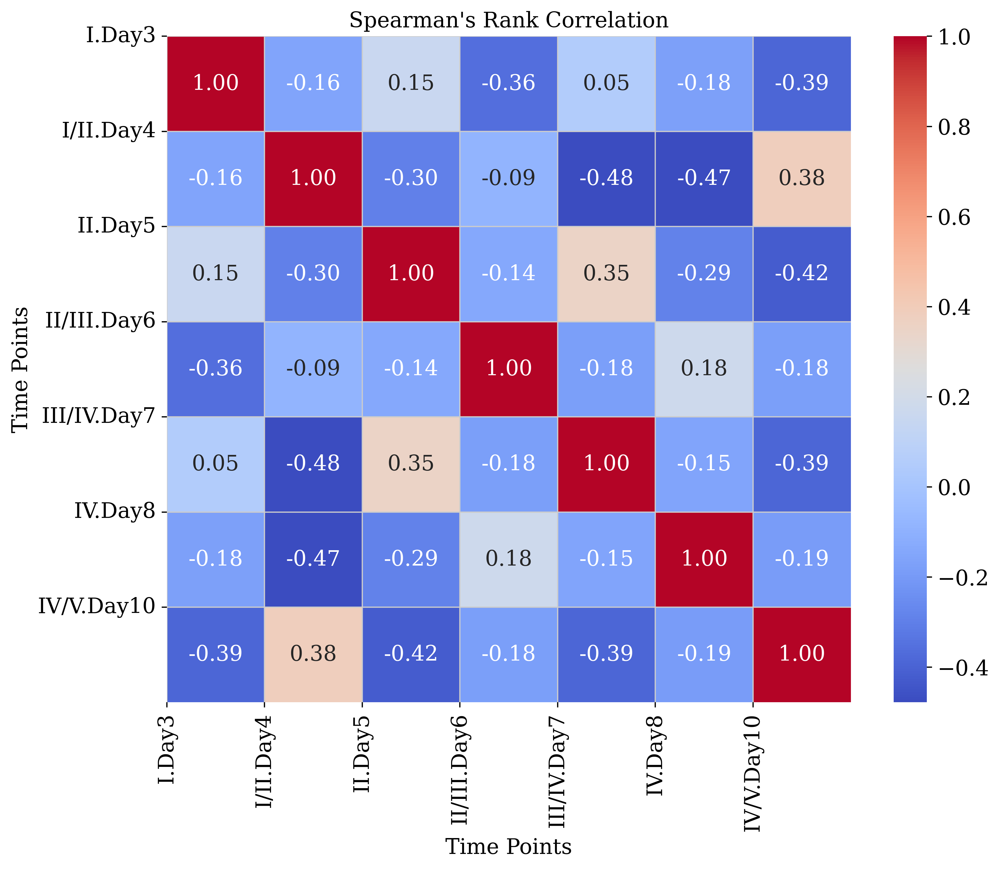

In [296]:
correlation_matrix = cell_prop.corr(method='spearman')

# Plot the correlation matrix
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, cmap='coolwarm', annot=True, fmt=".2f")
plt.xticks(ticks=range(len(cell_prop.columns)), labels=cell_prop.columns, rotation=90)
plt.yticks(ticks=range(len(cell_prop.index)), labels=cell_prop.index)
plt.title("Spearman's Rank Correlation")
plt.xlabel("Time Points")
plt.ylabel("Time Points")
plt.show()

In [299]:
correlation_matrix

Time_course,I.Day3,I/II.Day4,II.Day5,II/III.Day6,III/IV.Day7,IV.Day8,IV/V.Day10
Time_course,,,,,,,
I.Day3,1.000000,-0.158302,0.154365,-0.358524,0.049041,-0.176109,-0.389288
I/II.Day4,-0.158302,1.000000,-0.297153,-0.086782,-0.478073,-0.472695,0.382773
II.Day5,0.154365,-0.297153,1.000000,-0.141069,0.351389,-0.291020,-0.424546
II/III.Day6,-0.358524,-0.086782,-0.141069,1.000000,-0.179868,0.179997,-0.181224
III/IV.Day7,0.049041,-0.478073,0.351389,-0.179868,1.000000,-0.154774,-0.387262
IV.Day8,-0.176109,-0.472695,-0.291020,0.179997,-0.154774,1.000000,-0.192280
IV/V.Day10,-0.389288,0.382773,-0.424546,-0.181224,-0.387262,-0.192280,1.000000


In [38]:
adata = sc.read('/Users/mubashermohammed/Desktop/Gomesetal/mohammedetal.h5ad', cache=True)
#adata.write_h5ad('/Users/mubashermohammed/Desktop/Gomesetal/mohammedetal.h5ad')

In [39]:
#cell_type_prop_bulk.loc[cell_name]
#adata.obs.to_csv('/Users/mubashermohammed/Desktop/Gomesetal/sc_metadata.csv', index=True)
adata.obs

,n_genes,umi_counts,louvain_1.0,louvain_0.6,louvain_0.4,louvain_1.4,clusters,S_score,G2M_score,phase,...,stage,I.Day3,I.II.Day4,II.Day5,II.III.Day6,III.IV.Day7,IV.Day8,dpt_pseudotime,mono_pseudotime,lane
GTTGCTCTCGATAACC-1,1816,3259.8030,4,3,3,4,4,0.024129,0.024129,S,...,IV.Day8,False,False,False,False,False,True,0.041821,0.000000,lane_1
ATCCTATAGACTCTTG-1,1588,3045.0390,4,3,3,4,4,-0.091018,-0.091018,G1,...,I.Day3,True,False,False,False,False,False,0.037257,0.173356,lane_1
CCCAACTAGATACATG-1,2008,3426.1035,6,3,3,5,6,0.072096,0.072096,S,...,IV.Day8,False,False,False,False,False,True,0.060512,0.201561,lane_1
TCTTTGAAGACCTTTG-1,1468,2910.9124,4,3,3,4,4,-0.026258,-0.026258,G1,...,II.Day5,False,False,True,False,False,False,0.037260,0.233278,lane_1
TCTTTGAGTGAGGATC-1,1230,2638.6500,6,3,3,5,6,0.036512,0.036512,S,...,I.Day3,True,False,False,False,False,False,0.035456,0.243631,lane_1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTAGGCAGTATCCTTT-1,1182,2578.3652,1,1,1,0,1,-0.015271,-0.015271,G1,...,IV.Day8,False,False,False,False,False,True,0.546992,27.839323,lane_1
AGGCATTGTATCGCTA-1,800,2034.3064,1,1,1,0,1,0.014645,0.014645,S,...,IV.Day8,False,False,False,False,False,True,0.587216,27.874853,lane_1
AACCACATCTAGGCCG-1,945,2258.6104,1,1,1,0,1,-0.189472,-0.189472,G1,...,IV.Day8,False,False,False,False,False,True,0.599862,27.886792,lane_1
AAAGTCCGTAATGATG-1,1103,2474.8389,1,1,1,0,1,-0.149592,-0.149592,G1,...,IV.Day8,False,False,False,False,False,True,0.528490,27.887016,lane_1


In [1110]:
adata.obs['stage'] = adata.obs['stage'].replace(['III/IV.Day7', 'IV.Day8'], 'IV/V.Day7.8')

# Verify the changes
print(adata.obs['stage'].unique())

['II.Day5', 'IV/V.Day7.8', 'II.III.Day6', 'I.Day3', 'I.II.Day4', 'III.IV.Day7']
Categories (6, object): ['I.Day3', 'I.II.Day4', 'II.Day5', 'II.III.Day6', 'III.IV.Day7', 'IV/V.Day7.8']


/Users/mubashermohammed/miniconda3/envs/cellrank/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored

/Users/mubashermohammed/miniconda3/envs/cellrank/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



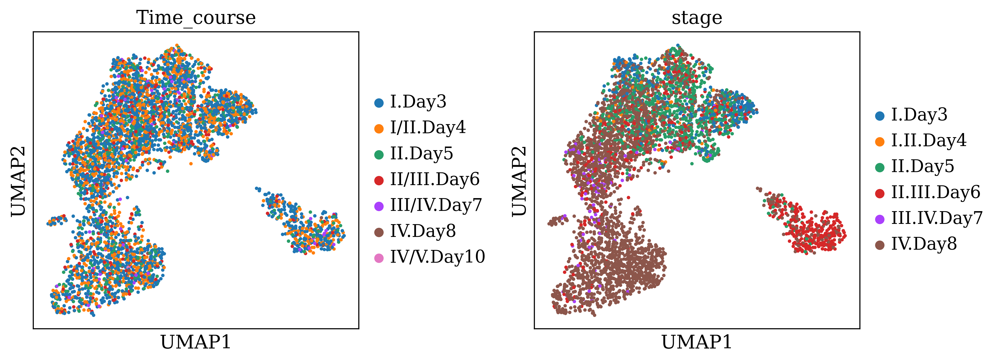

In [1114]:
sc.pl.umap(adata, color =['Time_course', 'stage'], wspace = 0.4, ) 
#save = 'new_bulk_labels.png'

In [1422]:
subset_adata.obs

,n_genes,umi_counts,louvain_1.0,louvain_0.6,louvain_0.4,louvain_1.4,clusters,S_score,G2M_score,phase,...,cell_type_marker,stage,I.Day3,I.II.Day4,II.Day5,II.III.Day6,III.IV.Day7,IV.Day8,dpt_pseudotime,mono_pseudotime
ATCCTATAGACTCTTG-1,1588,3045.0390,4,3,3,4,4,-0.091018,-0.091018,G1,...,o,I.Day3,True,False,False,False,False,False,0.037257,0.173356
TCTTTGAAGACCTTTG-1,1468,2910.9124,4,3,3,4,4,-0.026258,-0.026258,G1,...,s,II.Day5,False,False,True,False,False,False,0.037260,0.233278
TCTTTGAGTGAGGATC-1,1230,2638.6500,6,3,3,5,6,0.036512,0.036512,S,...,o,I.Day3,True,False,False,False,False,False,0.035456,0.243631
AGGGCTCCAGGACTTT-1,1411,2844.4888,6,3,3,5,6,-0.174880,-0.174880,G1,...,s,II.Day5,False,False,True,False,False,False,0.051507,0.251398
CTACAGATCATCGCAA-1,1536,2983.6294,4,3,3,4,4,-0.191084,-0.191084,G1,...,s,II.Day5,False,False,True,False,False,False,0.028883,0.262941
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
GCTGGGTAGGTTCTTG-1,809,2048.8647,1,1,1,0,1,-0.221289,-0.221289,G1,...,+,II.III.Day6,False,False,False,True,False,False,0.525292,27.368900
GTAGAAACAAAGTATG-1,877,2158.4788,1,1,1,0,1,-0.082951,-0.082951,G1,...,+,II.III.Day6,False,False,False,True,False,False,0.564492,27.388301
TCAAGACGTTAATCGC-1,525,1547.2958,1,1,1,0,1,-0.156536,-0.156536,G1,...,d,III.IV.Day7,False,False,False,False,True,False,0.567716,27.401714
CGGAATTAGTCTAGCT-1,483,1463.7227,8,1,1,10,8,-0.292808,-0.292808,G1,...,d,III.IV.Day7,False,False,False,False,True,False,0.625833,27.444391


In [1416]:
pseudotime_values = subset_adata.obs['mono_pseudotime'].values

# Order cells based on pseudotime values in ascending order
ordered_indices = np.argsort(pseudotime_values)
subset_adata = subset_adata[ordered_indices]

In [1418]:
pseudotime_values = subset_adata.obs['mono_pseudotime'].values
# Sort the cell_class column based on pseudotime values
sorted_indices = np.argsort(pseudotime_values)
sorted_stages = subset_adata.obs['stage'].values[sorted_indices]

# Print the sorted cell_class
print(sorted_stages)

['I.Day3', 'II.Day5', 'I.Day3', 'II.Day5', 'II.Day5', ..., 'II.III.Day6', 'II.III.Day6', 'III.IV.Day7', 'III.IV.Day7', 'III.IV.Day7']
Length: 1981
Categories (5, object): ['I.Day3', 'I.II.Day4', 'II.Day5', 'II.III.Day6', 'III.IV.Day7']


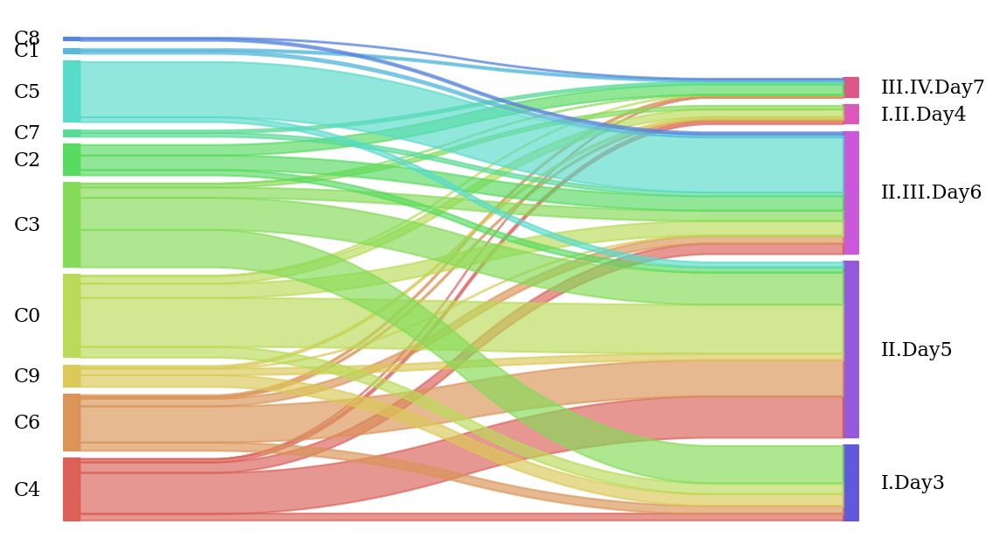

In [1421]:
#sorted_labels = ['I.Day3', 'I.II.Day4', 'II.Day5', 'II.III.Day6', 'III.IV.Day7', 'IV.Day8']
#sorted_data = adata.obs['bulk_labels'].sort_values(key=lambda x: pd.Categorical(x, categories=sorted_labels, ordered=True))

sankey.sankey(subset_adata.obs['annotation'], subset_adata.obs['stage'], aspect=15,
              fontsize=10, figure_name="cells_sankey")
plt.gcf().set_size_inches(8,5)
plt.show()

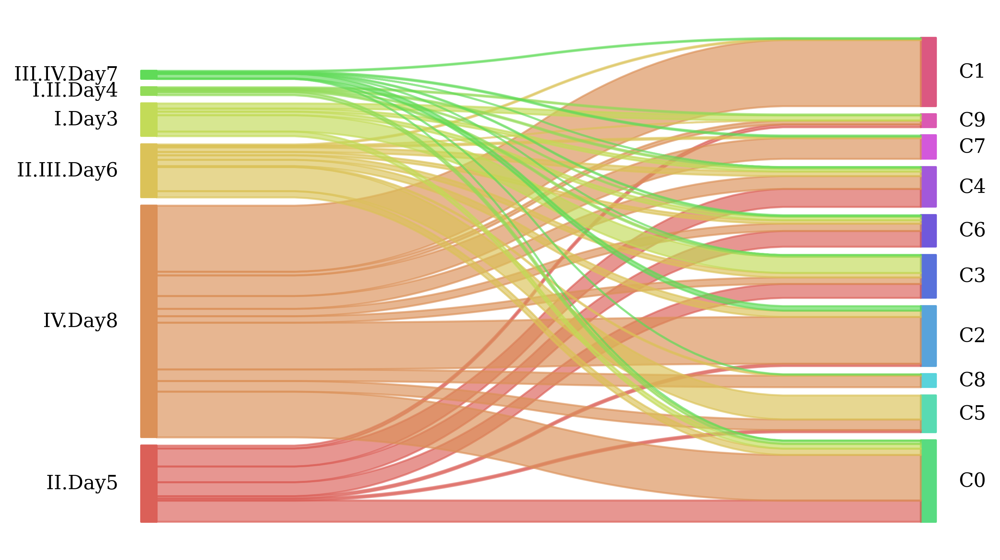

In [572]:
sankey.sankey(adata.obs['bulk_labels'], adata.obs['annotation'], aspect=15,
              fontsize=10, figure_name="cells_sankey")
plt.gcf().set_size_inches(8,5)
plt.show()

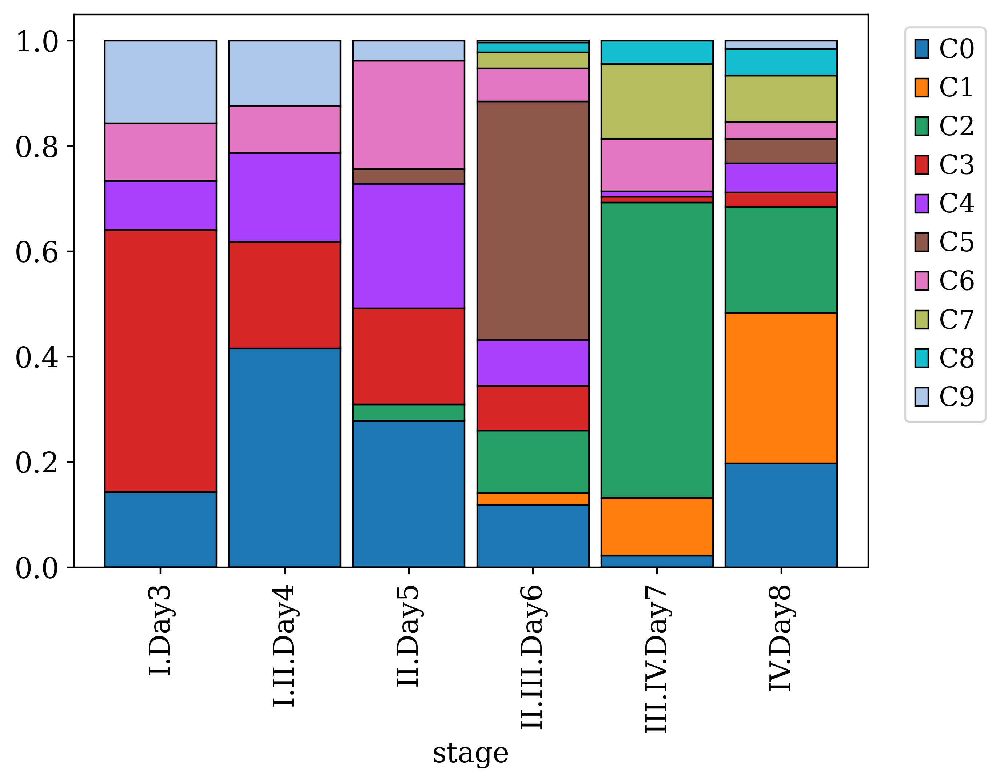

In [1115]:
tmp = pd.crosstab(adata.obs['stage'],adata.obs['annotation'], normalize='index')
ax = tmp.plot.bar(stacked=True, edgecolor='black', lw=0.8, figsize=(7,5), width=0.9,)



horiz_offset = 1.03
vert_offset = 1.
ax.grid(False)
ax.legend(bbox_to_anchor=(horiz_offset, vert_offset))
labels = ['Early gametocyte', 'Female lineage', 'Male lineage']
#ax.set_xticklabels(labels, rotation=30, ha="right",rotation_mode="anchor")

#plt.savefig('./figures/cell_prop_bulk_annotation.png', dpi = 300)

In [ ]:
expression_df = pd.read_csv('/Users/mubashermohammed/Desktop/Gomesetal/Bulk_Biljion/matrix.tsv', index_col=0)

# Transpose the DataFrame to have cells as rows and genes as columns
expression_df = expression_df.T

# Print the resulting DataFrame
expression_df


adata = sc.read('/Users/mubashermohammed/Desktop/Gomesetal/mohammedetal.h5ad', cache=True)

ad = ad.AnnData(expression_df, obs = adata.obs)

In [420]:
expression_df

,PF3D7_1401000,PF3D7_1401100,PF3D7_1401200,PF3D7_1401300,PF3D7_1401400,PF3D7_1401500,PF3D7_1401600,PF3D7_1401700,PF3D7_1401800,PF3D7_1401900,...,PF3D7_0113400,PF3D7_0113700,PF3D7_0113800,PF3D7_0113900,PF3D7_0114000,PF3D7_0114500,PF3D7_0115000,PF3D7_0115100,PF3D7_0115600,PF3D7_0115700
AAACCCAAGATGAATC-1,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,...,0.000000,0.0,0.0,0.0,2.220752,0.0,0.0,0.0,0.0,0.0
AAACCCAGTGAATAAC-1,0.0,0.0,0.0,0.0,0.0,0.0,2.084508,0.0,0.000000,2.118809,...,0.000000,0.0,0.0,0.0,2.050338,0.0,0.0,0.0,0.0,0.0
AAACCCAGTGAATTAG-1,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,2.130107,2.248547,...,0.000000,0.0,0.0,0.0,2.130107,0.0,0.0,0.0,0.0,0.0
AAACCCATCCATCTAT-1,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,...,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0
AAACGAAAGGCGTCCT-1,0.0,0.0,0.0,0.0,0.0,0.0,2.196035,0.0,0.000000,2.326256,...,0.000000,0.0,0.0,0.0,2.196035,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTTGGTAAGGCTG-1,0.0,0.0,0.0,0.0,0.0,0.0,2.226550,0.0,0.000000,2.257335,...,2.126589,0.0,0.0,0.0,2.244810,0.0,0.0,0.0,0.0,0.0
TTTGTTGGTCGGTGTC-1,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,...,0.000000,0.0,0.0,0.0,2.574320,0.0,0.0,0.0,0.0,0.0
TTTGTTGGTCGTGGTC-1,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,...,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0
TTTGTTGGTGAGTTGG-1,0.0,0.0,0.0,0.0,0.0,0.0,1.854044,0.0,0.000000,1.854044,...,0.000000,0.0,0.0,0.0,1.996651,0.0,0.0,0.0,0.0,0.0


In [435]:
common_cells = np.intersect1d(expression_df.index, adata.obs_names)

# Subset the expression_df based on the common cells
expression_subset = expression_df.loc[common_cells]

# Replace the row names in expression_subset with the corresponding annotation values from adata.obs
expression_subset.index = adata.obs.loc[common_cells, 'annotation']

# Print the resulting subset
#print("Expression Subset:")
df_anno = expression_subset
df_anno

,PF3D7_1401000,PF3D7_1401100,PF3D7_1401200,PF3D7_1401300,PF3D7_1401400,PF3D7_1401500,PF3D7_1401600,PF3D7_1401700,PF3D7_1401800,PF3D7_1401900,...,PF3D7_0113400,PF3D7_0113700,PF3D7_0113800,PF3D7_0113900,PF3D7_0114000,PF3D7_0114500,PF3D7_0115000,PF3D7_0115100,PF3D7_0115600,PF3D7_0115700
annotation,,,,,,,,,,,,,,,,,,,,,
C0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,...,0.000000,0.0,0.0,0.0,2.220752,0.0,0.0,0.0,0.0,0.0
C5,0.0,0.0,0.0,0.0,0.0,0.0,2.084508,0.0,0.000000,2.118809,...,0.000000,0.0,0.0,0.0,2.050338,0.0,0.0,0.0,0.0,0.0
C5,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,2.130107,2.248547,...,0.000000,0.0,0.0,0.0,2.130107,0.0,0.0,0.0,0.0,0.0
C8,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,...,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0
C5,0.0,0.0,0.0,0.0,0.0,0.0,2.196035,0.0,0.000000,2.326256,...,0.000000,0.0,0.0,0.0,2.196035,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
C5,0.0,0.0,0.0,0.0,0.0,0.0,2.226550,0.0,0.000000,2.257335,...,2.126589,0.0,0.0,0.0,2.244810,0.0,0.0,0.0,0.0,0.0
C0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,...,0.000000,0.0,0.0,0.0,2.574320,0.0,0.0,0.0,0.0,0.0
C6,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,...,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0


In [438]:
common_cells = np.intersect1d(expression_df.index, adata.obs_names)

# Subset the expression_df based on the common cells
expression_subset = expression_df.loc[common_cells]

# Replace the row names in expression_subset with the corresponding annotation values from adata.obs
expression_subset.index = adata.obs.loc[common_cells, 'bulk_labels']

# Print the resulting subset
#print("Expression Subset:")
df_bulk = expression_subset
df_bulk

,PF3D7_1401000,PF3D7_1401100,PF3D7_1401200,PF3D7_1401300,PF3D7_1401400,PF3D7_1401500,PF3D7_1401600,PF3D7_1401700,PF3D7_1401800,PF3D7_1401900,...,PF3D7_0113400,PF3D7_0113700,PF3D7_0113800,PF3D7_0113900,PF3D7_0114000,PF3D7_0114500,PF3D7_0115000,PF3D7_0115100,PF3D7_0115600,PF3D7_0115700
bulk_labels,,,,,,,,,,,,,,,,,,,,,
II.Day5,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,...,0.000000,0.0,0.0,0.0,2.220752,0.0,0.0,0.0,0.0,0.0
IV.Day8,0.0,0.0,0.0,0.0,0.0,0.0,2.084508,0.0,0.000000,2.118809,...,0.000000,0.0,0.0,0.0,2.050338,0.0,0.0,0.0,0.0,0.0
IV.Day8,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,2.130107,2.248547,...,0.000000,0.0,0.0,0.0,2.130107,0.0,0.0,0.0,0.0,0.0
IV.Day8,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,...,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0
II.III.Day6,0.0,0.0,0.0,0.0,0.0,0.0,2.196035,0.0,0.000000,2.326256,...,0.000000,0.0,0.0,0.0,2.196035,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
II.Day5,0.0,0.0,0.0,0.0,0.0,0.0,2.226550,0.0,0.000000,2.257335,...,2.126589,0.0,0.0,0.0,2.244810,0.0,0.0,0.0,0.0,0.0
IV.Day8,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,...,0.000000,0.0,0.0,0.0,2.574320,0.0,0.0,0.0,0.0,0.0
IV.Day8,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,...,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0


In [440]:
df_bulk

,PF3D7_1401000,PF3D7_1401100,PF3D7_1401200,PF3D7_1401300,PF3D7_1401400,PF3D7_1401500,PF3D7_1401600,PF3D7_1401700,PF3D7_1401800,PF3D7_1401900,...,PF3D7_0113400,PF3D7_0113700,PF3D7_0113800,PF3D7_0113900,PF3D7_0114000,PF3D7_0114500,PF3D7_0115000,PF3D7_0115100,PF3D7_0115600,PF3D7_0115700
bulk_labels,,,,,,,,,,,,,,,,,,,,,
II.Day5,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,...,0.000000,0.0,0.0,0.0,2.220752,0.0,0.0,0.0,0.0,0.0
IV.Day8,0.0,0.0,0.0,0.0,0.0,0.0,2.084508,0.0,0.000000,2.118809,...,0.000000,0.0,0.0,0.0,2.050338,0.0,0.0,0.0,0.0,0.0
IV.Day8,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,2.130107,2.248547,...,0.000000,0.0,0.0,0.0,2.130107,0.0,0.0,0.0,0.0,0.0
IV.Day8,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,...,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0
II.III.Day6,0.0,0.0,0.0,0.0,0.0,0.0,2.196035,0.0,0.000000,2.326256,...,0.000000,0.0,0.0,0.0,2.196035,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
II.Day5,0.0,0.0,0.0,0.0,0.0,0.0,2.226550,0.0,0.000000,2.257335,...,2.126589,0.0,0.0,0.0,2.244810,0.0,0.0,0.0,0.0,0.0
IV.Day8,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,...,0.000000,0.0,0.0,0.0,2.574320,0.0,0.0,0.0,0.0,0.0
IV.Day8,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,...,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0


In [444]:
annotations = df_anno.index.str.split('.').str[0]

# Group the rows based on annotations and aggregate the gene expression values
grouped_expression = df_anno.groupby(annotations).mean()

# Create a new DataFrame with annotation groups and gene names in columns
new_dataframe_anno = pd.DataFrame(grouped_expression.values.T, columns=grouped_expression.index, index=df_anno.columns)

# Print the new DataFrame
#print("New DataFrame:")
new_dataframe_anno

annotation,C0,C1,C2,C3,C4,C5,C6,C7,C8,C9
PF3D7_1401000,0.000000,0.000000,0.003517,0.000000,0.000000,0.006508,0.000000,0.000000,0.000000,0.015978
PF3D7_1401100,0.002937,0.006928,0.003192,0.000000,0.018678,0.007660,0.000000,0.000000,0.000000,0.037854
PF3D7_1401200,0.005025,0.000000,0.000000,0.000000,0.000000,0.000000,0.016700,0.000000,0.000000,0.049699
PF3D7_1401300,0.289376,0.258502,0.251952,0.188835,0.334509,0.166561,0.117107,0.130900,0.000000,0.224548
PF3D7_1401400,0.060313,0.022306,0.058177,0.032777,0.034125,0.043674,0.064797,0.025858,0.024303,0.240936
...,...,...,...,...,...,...,...,...,...,...
PF3D7_0114500,0.000000,0.030859,0.000000,0.000000,0.000000,0.000000,0.006615,0.011426,0.000000,0.000000
PF3D7_0115000,0.005129,0.005641,0.003530,0.007229,0.016772,0.032679,0.024136,0.000000,0.000000,0.000000
PF3D7_0115100,0.002591,0.050173,0.017533,0.000000,0.004274,0.088865,0.006451,0.017856,0.000000,0.000000
PF3D7_0115600,0.000000,0.006312,0.000000,0.000000,0.000000,0.000000,0.007183,0.000000,0.000000,0.000000


In [445]:
annotations = df_bulk.index.str.split('.').str[0]

# Group the rows based on annotations and aggregate the gene expression values
grouped_expression = df_bulk.groupby(annotations).mean()

# Create a new DataFrame with annotation groups and gene names in columns
new_dataframe_bulk = pd.DataFrame(grouped_expression.values.T, columns=grouped_expression.index, index=df_bulk.columns)

# Print the new DataFrame
#print("New DataFrame:")
new_dataframe_bulk

bulk_labels,I,II,III,IV
PF3D7_1401000,0.005044,0.001852,0.000000,0.000910
PF3D7_1401100,0.011950,0.006140,0.000000,0.004900
PF3D7_1401200,0.004934,0.007201,0.000000,0.001917
PF3D7_1401300,0.260515,0.185350,0.222667,0.246458
PF3D7_1401400,0.060227,0.046039,0.021719,0.050829
...,...,...,...,...
PF3D7_0114500,0.000000,0.001616,0.000000,0.010230
PF3D7_0115000,0.000000,0.017856,0.021936,0.006342
PF3D7_0115100,0.000000,0.023759,0.024555,0.023610
PF3D7_0115600,0.000000,0.001754,0.000000,0.001856


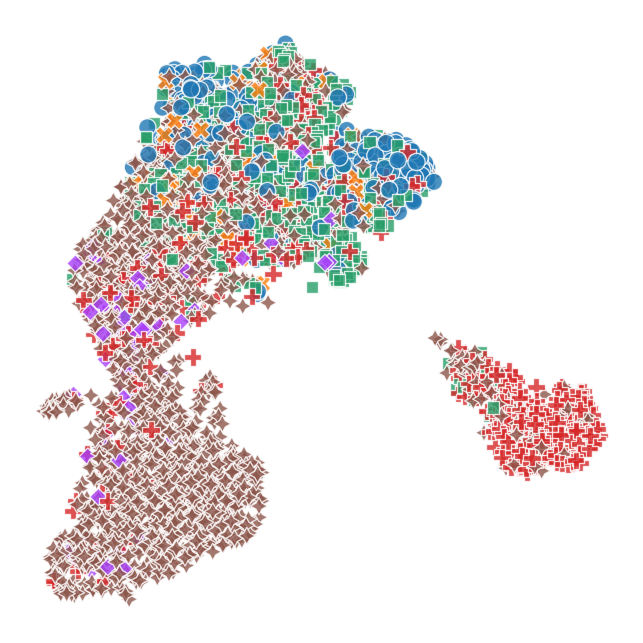

In [1374]:
import matplotlib.pyplot as plt
import seaborn as sns

marker_size = 60

# Define the marker shapes for each cell type
cell_types = np.unique(adata.obs['stage'])
n_cell_types = len(cell_types)
marker_shapes = dict(zip(cell_types, ['o', 'x', 's', '+', 'd', 'v'])) #['o', '+', 'x', 's', 'd', 'v']

# Set the marker shape for each cell type in a new column
adata.obs['cell_type_marker'] = adata.obs['stage'].map(marker_shapes)
colors = adata.uns['stage_colors']

# Plot the PCA with the different marker shapes
#plt.figure(figsize=(10, 8))
sns.scatterplot(x=adata.obsm['X_umap'][:, 0], y=adata.obsm['X_umap'][:, 1], 
                hue=adata.obs['stage'], color=colors, style=adata.obs['cell_type_marker'],
                s=marker_size, alpha=0.8, legend=False)  # Set alpha value for transparency and remove legend

# Remove the grid background
sns.despine()

# Remove axis lines
plt.axis('off')

# Set transparent background
plt.gca().set_facecolor('none')
plt.tight_layout()

# Save the plot as a PNG image
#plt.savefig('Bulk_labels_pca_plot.png', dpi=400)

# Show the plot
plt.show()


/Users/mubashermohammed/miniconda3/envs/cellrank/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



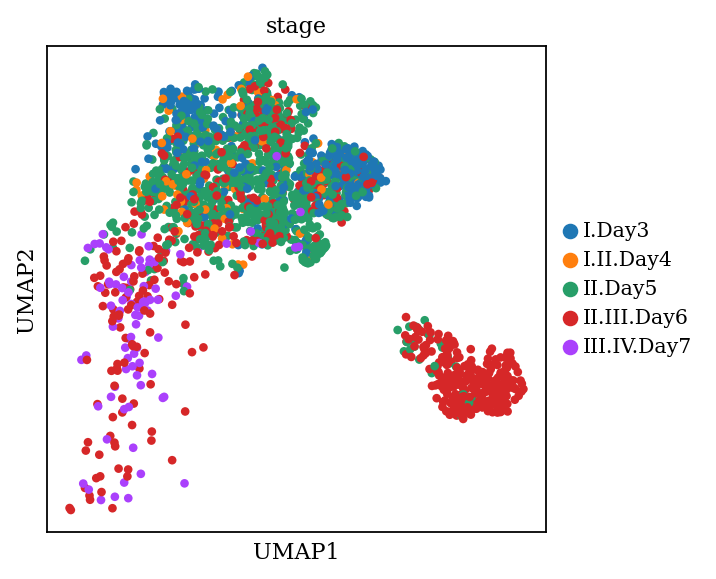

In [1375]:
sc.pl.umap(subset_adata, color = 'stage')

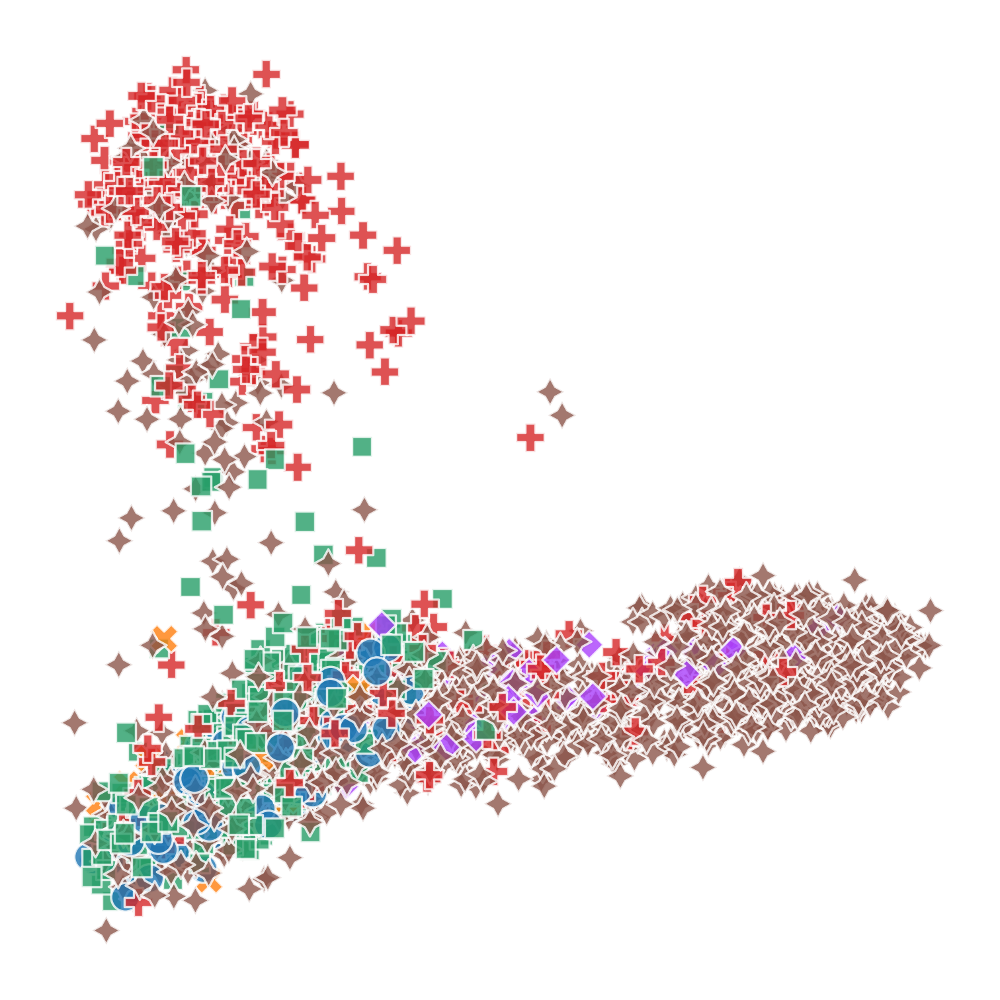

In [889]:
import matplotlib.pyplot as plt
import seaborn as sns

marker_size = 60

# Define the marker shapes for each cell type
cell_types = np.unique(adata.obs['bulk_labels'])
n_cell_types = len(cell_types)
marker_shapes = dict(zip(cell_types, ['o', 'x', 's', '+', 'd', 'v'])) #['o', '+', 'x', 's', 'd', 'v']

# Set the marker shape for each cell type in a new column
adata.obs['cell_type_marker'] = adata.obs['bulk_labels'].map(marker_shapes)
colors = adata.uns['bulk_labels_colors']

# Plot the PCA with the different marker shapes
#plt.figure(figsize=(10, 8))
sns.scatterplot(x=adata.obsm['X_pca'][:, 0], y=adata.obsm['X_pca'][:, 1], 
                hue=adata.obs['bulk_labels'], color=colors, style=adata.obs['cell_type_marker'],
                s=marker_size, alpha=0.8, legend=False)  # Set alpha value for transparency and remove legend

# Remove the grid background
sns.despine()

# Remove axis lines
plt.axis('off')

# Set transparent background
plt.gca().set_facecolor('none')
plt.tight_layout()

# Save the plot as a PNG image
#plt.savefig('Bulk_labels_pca_plot.png', dpi=400)

# Show the plot
plt.show()


In [1122]:
cells_of_interest = ['IV.Day8']

# Subset the AnnData object
D8_adata = adata[adata.obs['bulk_labels'].isin(cells_of_interest)].copy()


/Users/mubashermohammed/miniconda3/envs/cellrank/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored

/Users/mubashermohammed/miniconda3/envs/cellrank/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored

/Users/mubashermohammed/miniconda3/envs/cellrank/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



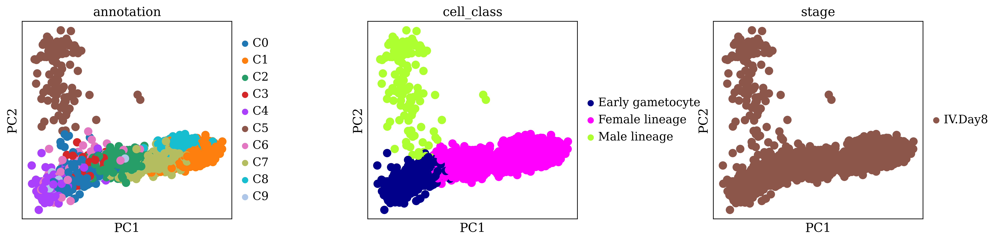

In [1125]:
sc.pl.pca(D8_adata, color=['annotation', 'cell_class', 'stage'],size=350, wspace = 0.5,  
          ) #save ='D8_anno_cellclass_pca.png'

In [ ]:
tmp = pd.crosstab(adata.obs['stage'],adata.obs['annotation'], normalize='index')
ax = tmp.plot.bar(stacked=True, edgecolor='black', lw=0.8, figsize=(7,5), width=0.9,)



horiz_offset = 1.03
vert_offset = 1.
ax.grid(False)
ax.legend(bbox_to_anchor=(horiz_offset, vert_offset))
labels = ['Early gametocyte', 'Female lineage', 'Male lineage']
#ax.set_xticklabels(labels, rotation=30, ha="right",rotation_mode="anchor")

#plt.savefig('./figures/cell_prop_bulk_annotation.png', dpi = 300)

In [987]:
cell_types = ['I.Day3', 'I.II.Day4', 'II.Day5', 'II.III.Day6', 'III.IV.Day7', 'IV.Day8']

# Create dummy columns in a new DataFrame
dummy_df = pd.get_dummies(adata.obs['stage'])

# Subset the dummy columns for the desired cell types
subset_dummy_df = dummy_df[cell_types]

# Add the subset dummy columns to adata.obs
adata.obs = pd.concat([adata.obs, subset_dummy_df], axis=1)
adata.obs

,n_genes,umi_counts,louvain_1.0,louvain_0.6,louvain_0.4,louvain_1.4,clusters,S_score,G2M_score,phase,...,Batch,Time_course,cell_type_marker,stage,I.Day3,I.II.Day4,II.Day5,II.III.Day6,III.IV.Day7,IV.Day8
AAACCCAAGATGAATC-1,1340,2798.60820,0,0,0,7,0,-0.175439,-0.175439,G1,...,Mohammed et al,I.Day3,x,II.Day5,False,False,True,False,False,False
AAACCCAGTGAATAAC-1,1524,2994.50590,5,5,5,11,5,0.047093,0.047093,S,...,Mohammed et al,III/IV.Day7,v,IV.Day8,False,False,False,False,False,True
AAACCCAGTGAATTAG-1,1298,2745.15400,5,5,5,11,5,-0.022611,-0.022611,G1,...,Mohammed et al,I/II.Day4,v,IV.Day8,False,False,False,False,False,True
AAACCCATCCATCTAT-1,241,893.01843,8,1,1,10,8,-0.067437,-0.067437,G1,...,Mohammed et al,II/III.Day6,v,IV.Day8,False,False,False,False,False,True
AAACGAAAGGCGTCCT-1,1192,2590.70560,5,5,5,6,5,-0.199007,-0.199007,G1,...,Mohammed et al,I/II.Day4,o,II.III.Day6,False,False,False,True,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTTGGTAAGGCTG-1,1305,2757.71140,5,5,5,11,5,-0.119880,-0.119880,G1,...,Mohammed et al,I.Day3,x,II.Day5,False,False,True,False,False,False
TTTGTTGGTCGGTGTC-1,808,2063.05400,0,0,0,2,0,-0.045277,-0.045277,G1,...,Mohammed et al,I/II.Day4,v,IV.Day8,False,False,False,False,False,True
TTTGTTGGTCGTGGTC-1,686,1850.38290,6,3,3,5,6,-0.048457,-0.048457,G1,...,Mohammed et al,I.Day3,v,IV.Day8,False,False,False,False,False,True
TTTGTTGGTGAGTTGG-1,1728,3202.45100,5,5,5,11,5,-0.009218,-0.009218,G1,...,Mohammed et al,I.Day3,v,IV.Day8,False,False,False,False,False,True


In [1068]:
adata.uns['stage_colors']

['#1f77b4', '#ff7f0e', '#279e68', '#d62728', '#aa40fc', '#8c564b']

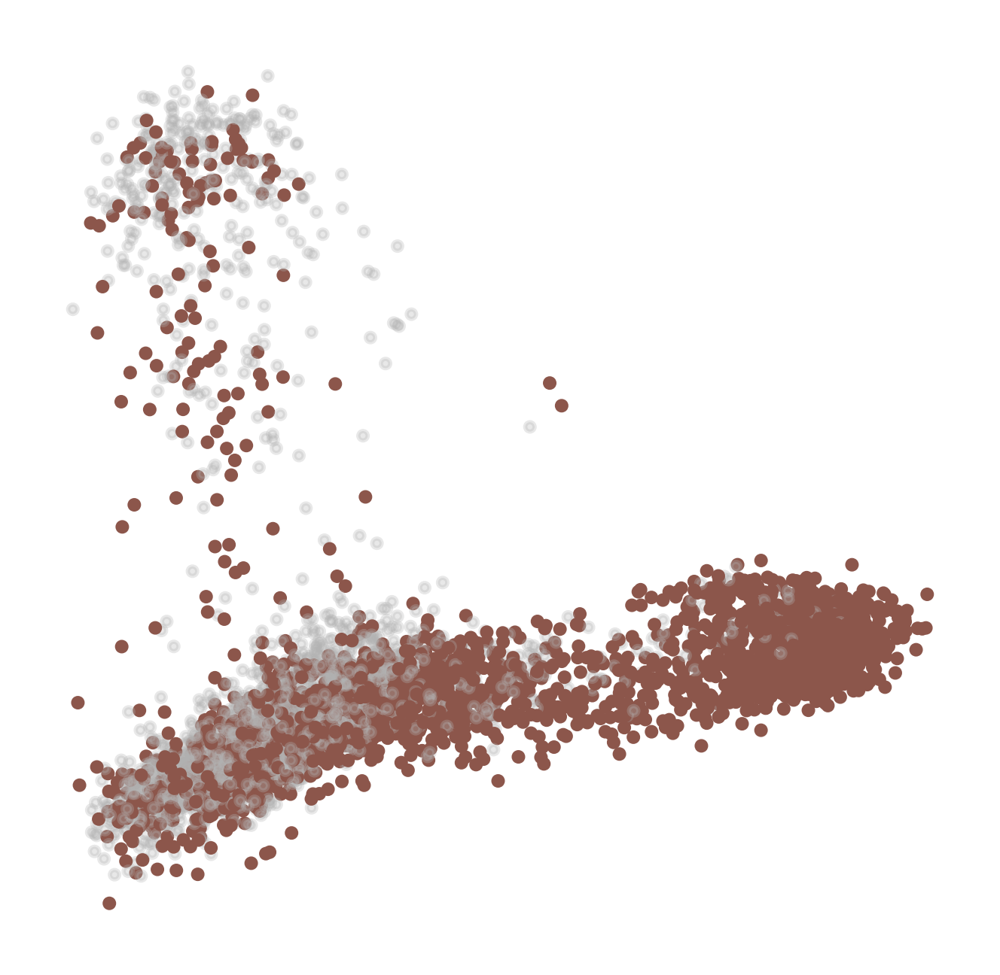

In [1085]:
desired_cell_type = 'IV.Day8'

# Get the index of the desired cell type in the 'stage' category
cell_type_index = np.where(adata.obs['stage'].cat.categories == desired_cell_type)[0][0]

# Create a color palette with grey for other cell types and the desired color for the specific cell type
color_palette = [(0.7, 0.7, 0.7, 0.3)] * len(adata.obs['stage'].cat.categories)
#color_palette = ['gray'] * len(adata.obs['stage'].cat.categories)
color_palette[cell_type_index] = '#8c564b'  # Blue color code

# Get the color for each cell based on the 'stage' category
color_by_stage = [color_palette[i] for i in adata.obs['stage'].cat.codes]

# Plot the PCA with the desired cell type highlighted
#sc.pl.pca(adata, color='stage', projection='2d', show=False)

# Assign custom colors to the points
plt.scatter(adata.obsm['X_pca'][:, 0], adata.obsm['X_pca'][:, 1], c=color_by_stage, s=5 )

#plt.grid(False)

# Remove axis lines
plt.axis('off')

# Set transparent background
plt.gca().set_facecolor('none')

# Save the plot as a PNG image
plt.savefig('./figures/D8_pca_plot.png', dpi=400)

# Show the plot
plt.show()

/Users/mubashermohammed/miniconda3/envs/cellrank/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



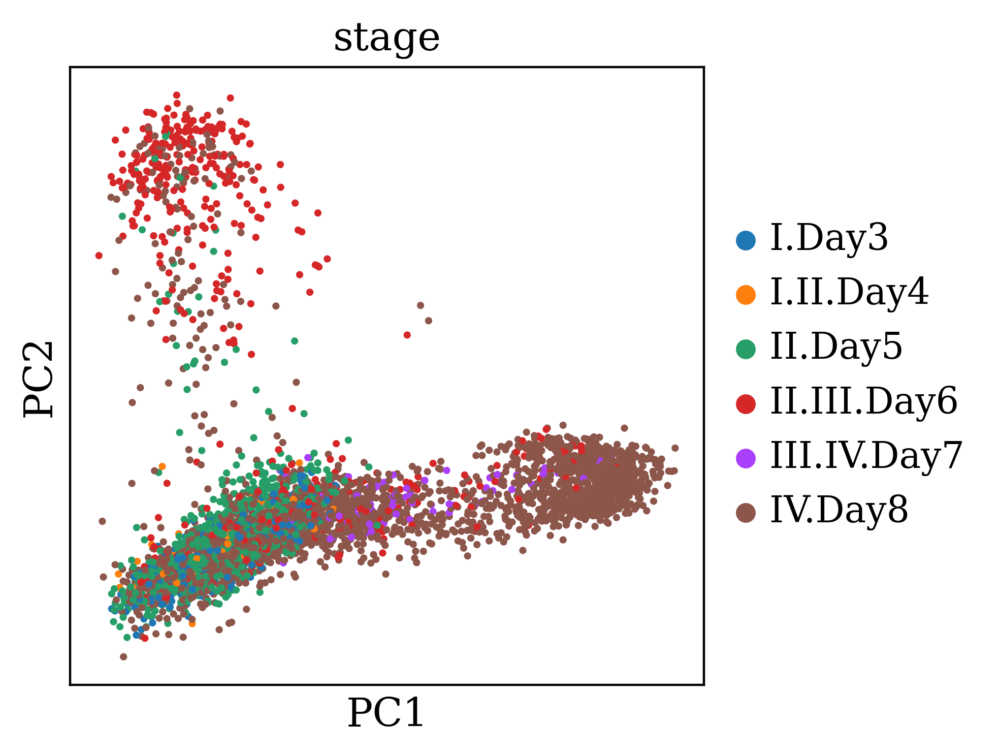

In [990]:
ax = sc.pl.pca(adata, color=['stage'], projection = '2d' ) 
#save ='bulklabels_pca_new_cellT_marker.png'

In [25]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import spearmanr
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler

In [355]:
expression_df

,PF3D7_1401000,PF3D7_1401100,PF3D7_1401200,PF3D7_1401300,PF3D7_1401400,PF3D7_1401500,PF3D7_1401600,PF3D7_1401700,PF3D7_1401800,PF3D7_1401900,...,PF3D7_0113400,PF3D7_0113700,PF3D7_0113800,PF3D7_0113900,PF3D7_0114000,PF3D7_0114500,PF3D7_0115000,PF3D7_0115100,PF3D7_0115600,PF3D7_0115700
AAACCCAAGATGAATC-1,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,...,0.000000,0.0,0.0,0.0,2.220752,0.0,0.0,0.0,0.0,0.0
AAACCCAGTGAATAAC-1,0.0,0.0,0.0,0.0,0.0,0.0,2.084508,0.0,0.000000,2.118809,...,0.000000,0.0,0.0,0.0,2.050338,0.0,0.0,0.0,0.0,0.0
AAACCCAGTGAATTAG-1,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,2.130107,2.248547,...,0.000000,0.0,0.0,0.0,2.130107,0.0,0.0,0.0,0.0,0.0
AAACCCATCCATCTAT-1,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,...,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0
AAACGAAAGGCGTCCT-1,0.0,0.0,0.0,0.0,0.0,0.0,2.196035,0.0,0.000000,2.326256,...,0.000000,0.0,0.0,0.0,2.196035,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTTGGTAAGGCTG-1,0.0,0.0,0.0,0.0,0.0,0.0,2.226550,0.0,0.000000,2.257335,...,2.126589,0.0,0.0,0.0,2.244810,0.0,0.0,0.0,0.0,0.0
TTTGTTGGTCGGTGTC-1,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,...,0.000000,0.0,0.0,0.0,2.574320,0.0,0.0,0.0,0.0,0.0
TTTGTTGGTCGTGGTC-1,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,...,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0
TTTGTTGGTGAGTTGG-1,0.0,0.0,0.0,0.0,0.0,0.0,1.854044,0.0,0.000000,1.854044,...,0.000000,0.0,0.0,0.0,1.996651,0.0,0.0,0.0,0.0,0.0


In [17]:
shared_genes = expression_df.columns.intersection(bulk_df.columns)

# Subset the data frames to include only the shared genes
expression_shared = expression_df[shared_genes]
bulk_shared = bulk_df[shared_genes]

In [20]:
imputer = SimpleImputer()
expression_imputed = imputer.fit_transform(expression_shared)
bulk_imputed = imputer.transform(bulk_shared)


In [21]:
expression_shared_df = pd.DataFrame(expression_imputed, index=expression_df.index, columns=shared_genes)
bulk_shared_df = pd.DataFrame(bulk_imputed, index=bulk_df.index, columns=shared_genes)

In [22]:
expression_normalized = (expression_shared_df - expression_shared_df.mean()) / expression_shared_df.std()
bulk_normalized = (bulk_shared_df - bulk_shared_df.mean()) / bulk_shared_df.std()


In [29]:
scaler = StandardScaler()

# Fit and transform the expression data in df1_shared
sc_scaled = pd.DataFrame(scaler.fit_transform(expression_normalized.values), index=expression_normalized.index, columns=expression_normalized.columns)

# Transform the expression data in df2_shared using the fitted scaler
bulk_scaled = pd.DataFrame(scaler.transform(bulk_normalized.values), index=bulk_normalized.index, columns=bulk_normalized.columns)

In [37]:
sc_scaled

,PF3D7_1401000,PF3D7_1401100,PF3D7_1401200,PF3D7_1401300,PF3D7_1401400,PF3D7_1401500,PF3D7_1401600,PF3D7_1401700,PF3D7_1401800,PF3D7_1401900,...,PF3D7_0113200,PF3D7_0113300,PF3D7_0113400,PF3D7_0113700,PF3D7_0113800,PF3D7_0113900,PF3D7_0114000,PF3D7_0114500,PF3D7_0115600,PF3D7_0115700
annotation,,,,,,,,,,,,,,,,,,,,,
C0,-0.025581,-0.04612,-0.038408,-0.323969,-0.142466,-0.110648,-0.628919,-0.081859,-0.435224,-0.961279,...,-0.179116,-0.145068,-0.323270,-0.149045,-0.074839,-0.094061,0.490899,-0.050664,-0.025426,-0.077064
C5,-0.025581,-0.04612,-0.038408,-0.323969,-0.142466,-0.110648,1.503713,-0.081859,-0.435224,0.980035,...,-0.179116,-0.145068,-0.323270,-0.149045,-0.074839,-0.094061,0.104874,-0.050664,-0.025426,-0.077064
C5,-0.025581,-0.04612,-0.038408,-0.323969,-0.142466,-0.110648,-0.628919,-0.081859,1.868469,1.085215,...,4.654522,-0.145068,-0.323270,-0.149045,-0.074839,-0.094061,-0.021239,-0.050664,-0.025426,-0.077064
C8,-0.025581,-0.04612,-0.038408,-0.323969,-0.142466,-0.110648,-0.628919,-0.081859,-0.435224,-0.961279,...,-0.179116,-0.145068,-0.323270,-0.149045,-0.074839,-0.094061,-1.382537,-0.050664,-0.025426,-0.077064
C5,-0.025581,-0.04612,-0.038408,-0.323969,-0.142466,-0.110648,1.141329,-0.081859,-0.435224,1.156539,...,-0.179116,-0.145068,-0.323270,-0.149045,-0.074839,-0.094061,-0.025903,-0.050664,-0.025426,-0.077064
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
C5,-0.025581,-0.04612,-0.038408,-0.323969,-0.142466,-0.110648,1.725274,-0.081859,-0.435224,1.166892,...,4.668970,-0.145068,2.358071,-0.149045,-0.074839,-0.094061,0.519898,-0.050664,-0.025426,-0.077064
C0,-0.025581,-0.04612,-0.038408,-0.323969,-0.142466,-0.110648,-0.628919,-0.081859,-0.435224,-0.961279,...,-0.179116,-0.145068,-0.323270,-0.149045,-0.074839,-0.094061,0.323938,-0.050664,-0.025426,-0.077064
C6,-0.025581,-0.04612,-0.038408,-0.323969,-0.142466,-0.110648,-0.628919,-0.081859,-0.435224,-0.961279,...,-0.179116,-0.145068,-0.323270,-0.149045,-0.074839,-0.094061,-1.382537,-0.050664,-0.025426,-0.077064


In [39]:
import pandas as pd
import scipy.io
import os
destination = os.path.dirname("/Users/mubashermohammed/Desktop/Gomesetal/Bulk_Biljion/")

In [41]:
pd.DataFrame(ad.var.index).to_csv(os.path.join(destination, "genes.tsv" ),   sep = "\t", header = False)
pd.DataFrame(ad.obs.index).to_csv(os.path.join(destination, "barcodes.tsv"), sep = "\t", header = False)
ad.obs.to_csv(os.path.join(destination, "cells_metadata.csv"), sep = "\t", header = True)
#scipy.io.mmwrite(os.path.join(destination, "matrix.mtx"), adata.X)
ad.T.to_df().to_csv('/Users/mubashermohammed/Desktop/Gomesetal/Bulk_Biljion/matrix.tsv')

In [23]:
import numpy as np

# Total number of cells
total_cells = 4555

# Selecting top 1700 cell barcodes
top_1700_cells = adata.obs_names[:1500]

# Selecting 200 cell barcodes from the middle
middle_200_cells = adata.obs_names[total_cells//5 - 100 : total_cells//5 + 100]

# Selecting 20 cell barcodes from the end
end_20_cells = adata.obs_names[-1000:]

# Combining all selected cell barcodes
selected_cells = np.concatenate([top_1700_cells, middle_200_cells, end_20_cells])

# Creating a new column 'lane' in adata.obs
adata.obs['lane'] = 'lane_2'

# Assigning 'lane_1' to the selected cells
adata.obs.loc[selected_cells, 'lane'] = 'lane_1'
adata.obs

,n_genes,umi_counts,louvain_1.0,louvain_0.6,louvain_0.4,louvain_1.4,clusters,S_score,G2M_score,phase,...,stage,I.Day3,I.II.Day4,II.Day5,II.III.Day6,III.IV.Day7,IV.Day8,dpt_pseudotime,mono_pseudotime,lane
GTTGCTCTCGATAACC-1,1816,3259.8030,4,3,3,4,4,0.024129,0.024129,S,...,IV.Day8,False,False,False,False,False,True,0.041821,0.000000,lane_1
ATCCTATAGACTCTTG-1,1588,3045.0390,4,3,3,4,4,-0.091018,-0.091018,G1,...,I.Day3,True,False,False,False,False,False,0.037257,0.173356,lane_1
CCCAACTAGATACATG-1,2008,3426.1035,6,3,3,5,6,0.072096,0.072096,S,...,IV.Day8,False,False,False,False,False,True,0.060512,0.201561,lane_1
TCTTTGAAGACCTTTG-1,1468,2910.9124,4,3,3,4,4,-0.026258,-0.026258,G1,...,II.Day5,False,False,True,False,False,False,0.037260,0.233278,lane_1
TCTTTGAGTGAGGATC-1,1230,2638.6500,6,3,3,5,6,0.036512,0.036512,S,...,I.Day3,True,False,False,False,False,False,0.035456,0.243631,lane_1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTAGGCAGTATCCTTT-1,1182,2578.3652,1,1,1,0,1,-0.015271,-0.015271,G1,...,IV.Day8,False,False,False,False,False,True,0.546992,27.839323,lane_1
AGGCATTGTATCGCTA-1,800,2034.3064,1,1,1,0,1,0.014645,0.014645,S,...,IV.Day8,False,False,False,False,False,True,0.587216,27.874853,lane_1
AACCACATCTAGGCCG-1,945,2258.6104,1,1,1,0,1,-0.189472,-0.189472,G1,...,IV.Day8,False,False,False,False,False,True,0.599862,27.886792,lane_1
AAAGTCCGTAATGATG-1,1103,2474.8389,1,1,1,0,1,-0.149592,-0.149592,G1,...,IV.Day8,False,False,False,False,False,True,0.528490,27.887016,lane_1


/Users/mubashermohammed/miniconda3/envs/cellrank/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/mubashermohammed/miniconda3/envs/cellrank/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


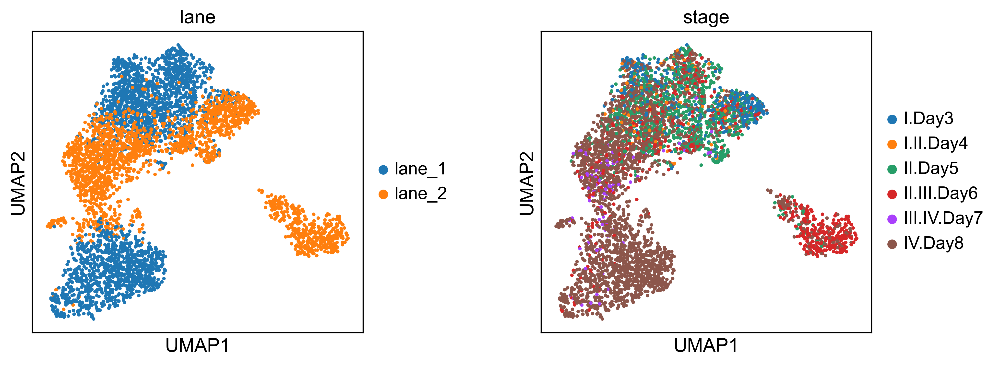

In [29]:
sc.pl.umap(adata, color =['lane', 'stage'], wspace = 0.4, save = 'lane_info.png') 

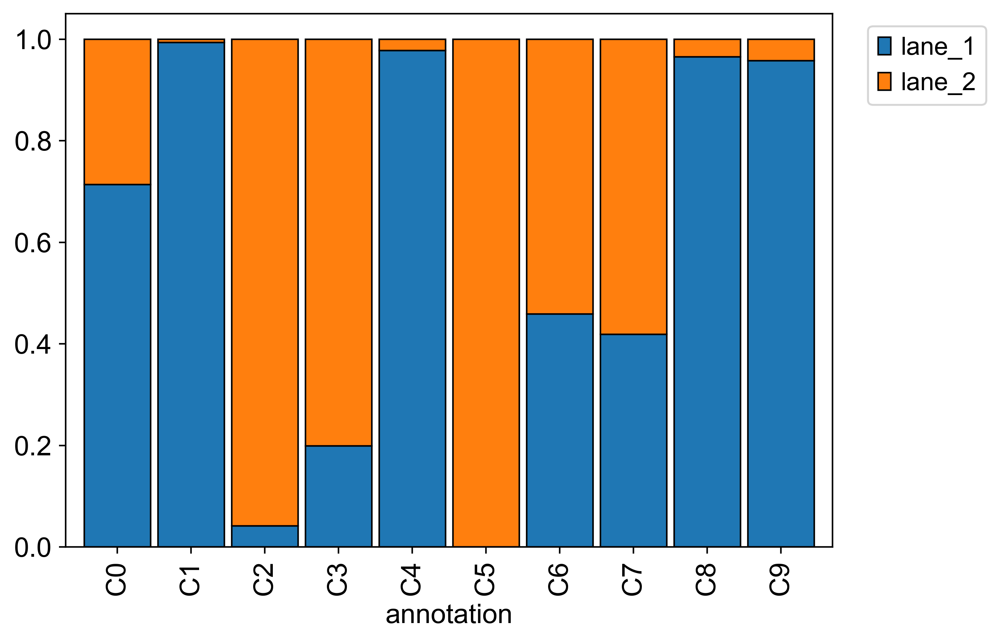

In [37]:
tmp = pd.crosstab(adata.obs['annotation'],adata.obs['lane'], normalize='index')
ax = tmp.plot.bar(stacked=True, edgecolor='black', lw=0.8, figsize=(7,5), width=0.9,)



horiz_offset = 1.03
vert_offset = 1.
ax.grid(False)
ax.legend(bbox_to_anchor=(horiz_offset, vert_offset))
labels = ['Early gametocyte', 'Female lineage', 'Male lineage']
#ax.set_xticklabels(labels, rotation=30, ha="right",rotation_mode="anchor")

plt.savefig('./figures/lane_info_cell_prop_annotation.png', dpi = 400)